<a href="https://colab.research.google.com/github/ArkadiptaSaha/XAI_Rice_Yield-Feature-Reduction-Framework/blob/main/XAI_Rice_Yield.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam

In [ ]:
data1 = pd.read_csv('Crop_Yield_Data_challenge_2.csv')
data1

,District,Latitude,Longitude,"Season(SA = Summer Autumn, WS = Winter Spring)","Rice Crop Intensity(D=Double, T=Triple)",Date of Harvest,Field size (ha),Rice Yield (kg/ha)
0,Chau_Phu,10.510542,105.248554,SA,T,15-07-2022,3.40,5500
1,Chau_Phu,10.509150,105.265098,SA,T,15-07-2022,2.43,6000
2,Chau_Phu,10.467721,105.192464,SA,D,15-07-2022,1.95,6400
3,Chau_Phu,10.494453,105.241281,SA,T,15-07-2022,4.30,6000
4,Chau_Phu,10.535058,105.252744,SA,D,14-07-2022,3.30,6400
...,...,...,...,...,...,...,...,...
552,Thoai_Son,10.364419,105.164984,WS,T,12-04-2022,7.80,6640
553,Thoai_Son,10.358094,105.189541,WS,T,12-04-2022,2.00,7200
554,Thoai_Son,10.368014,105.238516,WS,T,12-04-2022,6.20,7200
555,Thoai_Son,10.275419,105.234563,WS,T,20-04-2022,3.00,6400


In [ ]:
data2 = pd.read_csv('ndvi.csv', encoding='ISO-8859-1')
data2

,ndvi
0,0.078939
1,0.012374
2,0.186522
3,0.106439
4,0.417298
...,...
539,0.077382
540,0.075287
541,0.065204
542,0.265296


In [ ]:

data3 = pd.read_csv('Sentinel_1.csv', encoding='ISO-8859-1')
data3

,min_vh,min_vv,max_vh,max_vv,range_vh,range_vv,mean_vh,mean_vv,std_vh,std_vv,ratio_vv_vh,rvi
0,0.024129,0.005246,0.357296,0.059441,0.333167,0.054196,0.132912,0.026118,0.092425,0.015212,0.196509,3.056232
1,0.053835,0.016737,0.448553,0.136669,0.394718,0.119932,0.179150,0.051274,0.115343,0.033655,0.286205,2.742171
2,0.016936,0.010781,0.424133,0.114186,0.407197,0.103404,0.116764,0.030350,0.120106,0.028909,0.259923,2.828422
3,0.027307,0.003393,0.335494,0.070942,0.308188,0.067549,0.111655,0.026225,0.086151,0.019026,0.234878,2.914902
4,0.021431,0.004080,0.226502,0.089368,0.205071,0.085289,0.114040,0.028807,0.059231,0.024090,0.252603,2.853250
...,...,...,...,...,...,...,...,...,...,...,...,...
552,0.007758,0.002246,0.447422,0.092458,0.439664,0.090212,0.126006,0.031105,0.134158,0.025072,0.246852,2.873013
553,0.023660,0.003157,0.255528,0.080506,0.231868,0.077349,0.095423,0.025837,0.064118,0.017987,0.270766,2.792296
554,0.008751,0.002891,0.387613,0.155461,0.378862,0.152571,0.146239,0.037837,0.120536,0.035396,0.258736,2.832422
555,0.019068,0.001930,0.488400,0.097946,0.469332,0.096017,0.139716,0.029845,0.132740,0.024917,0.213610,2.991860


In [ ]:
data4 = pd.read_csv('Weather_Data.csv')
data4

,Lattitude,Longtitude,Season,tempmax section 1,tempmax section 2,tempmax section 3,tempmax section 4,tempmax section 5,tempmax section 6,tempmax section 7,...,Sunlight duration section 5,Sunlight duration section 6,Sunlight duration section 7,Sunlight duration section 8,Sunlight duration section 9,Sunlight duration section 10,Sunlight duration section 11,Sunlight duration section 12,Sunlight duration section 13,Sunlight duration section 14
0,10.510542,105.248554,SA,26.687500,27.962500,28.300000,28.437500,26.9500,27.6,28.037500,...,23.800,24.000,24.000,23.000,23.000,23.000,24.000,23.000,24.000,23.000000
1,10.509150,105.265098,SA,26.675000,27.937500,28.300000,28.425000,26.9250,27.6,28.012500,...,23.800,24.000,24.000,23.000,23.000,23.000,24.000,23.000,24.000,23.000000
2,10.467721,105.192464,SA,28.171429,28.757143,28.014286,27.185714,27.5000,28.2,26.971429,...,24.000,25.000,23.000,23.000,23.000,23.000,24.000,23.000,24.000,23.000000
3,10.494453,105.241281,SA,26.687500,27.962500,28.312500,28.437500,26.9625,27.6,28.050000,...,23.900,24.000,24.000,23.000,23.000,23.000,24.000,23.000,24.000,23.000000
4,10.535058,105.252744,SA,26.687500,27.937500,28.300000,28.425000,26.9250,27.6,28.012500,...,23.800,24.000,24.000,23.000,23.000,23.000,24.000,23.000,24.000,23.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
404,10.327617,105.330240,SA,33.000000,33.000000,33.400000,34.200000,33.0000,34.0,33.000000,...,45013.875,45205.375,45377.875,45526.125,45648.000,45738.875,45796.250,45817.500,45803.125,45673.850000
405,10.339092,105.325101,SA,33.400000,34.200000,34.000000,33.000000,34.0000,33.0,33.000000,...,45308.250,45468.125,45601.750,45706.375,45778.125,45815.375,45816.375,45781.250,45711.250,45600.000000
406,10.282445,105.330149,SA,33.400000,34.100000,34.100000,33.000000,34.0000,33.0,33.000000,...,45249.625,45414.625,45555.375,45667.875,45749.000,45796.000,45807.250,45782.625,45723.000,45605.000000
407,10.258961,105.323388,SA,33.400000,34.100000,34.100000,33.000000,34.0000,33.0,33.000000,...,45245.750,45410.250,45551.000,45663.250,45744.125,45791.125,45802.000,45777.500,45718.250,45600.272727


In [ ]:
data = pd.concat([data1, data2, data3, data4], axis=1)
data

,District,Latitude,Longitude,"Season(SA = Summer Autumn, WS = Winter Spring)","Rice Crop Intensity(D=Double, T=Triple)",Date of Harvest,Field size (ha),Rice Yield (kg/ha),ndvi,min_vh,...,Sunlight duration section 5,Sunlight duration section 6,Sunlight duration section 7,Sunlight duration section 8,Sunlight duration section 9,Sunlight duration section 10,Sunlight duration section 11,Sunlight duration section 12,Sunlight duration section 13,Sunlight duration section 14
0,Chau_Phu,10.510542,105.248554,SA,T,15-07-2022,3.40,5500,0.078939,0.024129,...,23.8,24.0,24.0,23.0,23.0,23.0,24.0,23.0,24.0,23.0
1,Chau_Phu,10.509150,105.265098,SA,T,15-07-2022,2.43,6000,0.012374,0.053835,...,23.8,24.0,24.0,23.0,23.0,23.0,24.0,23.0,24.0,23.0
2,Chau_Phu,10.467721,105.192464,SA,D,15-07-2022,1.95,6400,0.186522,0.016936,...,24.0,25.0,23.0,23.0,23.0,23.0,24.0,23.0,24.0,23.0
3,Chau_Phu,10.494453,105.241281,SA,T,15-07-2022,4.30,6000,0.106439,0.027307,...,23.9,24.0,24.0,23.0,23.0,23.0,24.0,23.0,24.0,23.0
4,Chau_Phu,10.535058,105.252744,SA,D,14-07-2022,3.30,6400,0.417298,0.021431,...,23.8,24.0,24.0,23.0,23.0,23.0,24.0,23.0,24.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552,Thoai_Son,10.364419,105.164984,WS,T,12-04-2022,7.80,6640,NaN,0.007758,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
553,Thoai_Son,10.358094,105.189541,WS,T,12-04-2022,2.00,7200,NaN,0.023660,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
554,Thoai_Son,10.368014,105.238516,WS,T,12-04-2022,6.20,7200,NaN,0.008751,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
555,Thoai_Son,10.275419,105.234563,WS,T,20-04-2022,3.00,6400,NaN,0.019068,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
bins = [5200, 5850, 6500, 7150, 8000]
labels = ['0', '1', '2','3']

In [ ]:
data['Class'] = pd.cut(data['Rice Yield (kg/ha)'], bins=bins, labels=labels, right=False)

data

,District,Latitude,Longitude,"Season(SA = Summer Autumn, WS = Winter Spring)","Rice Crop Intensity(D=Double, T=Triple)",Date of Harvest,Field size (ha),Rice Yield (kg/ha),ndvi,min_vh,...,Sunlight duration section 6,Sunlight duration section 7,Sunlight duration section 8,Sunlight duration section 9,Sunlight duration section 10,Sunlight duration section 11,Sunlight duration section 12,Sunlight duration section 13,Sunlight duration section 14,Class
0,Chau_Phu,10.510542,105.248554,SA,T,15-07-2022,3.40,5500,0.078939,0.024129,...,24.0,24.0,23.0,23.0,23.0,24.0,23.0,24.0,23.0,0
1,Chau_Phu,10.509150,105.265098,SA,T,15-07-2022,2.43,6000,0.012374,0.053835,...,24.0,24.0,23.0,23.0,23.0,24.0,23.0,24.0,23.0,1
2,Chau_Phu,10.467721,105.192464,SA,D,15-07-2022,1.95,6400,0.186522,0.016936,...,25.0,23.0,23.0,23.0,23.0,24.0,23.0,24.0,23.0,1
3,Chau_Phu,10.494453,105.241281,SA,T,15-07-2022,4.30,6000,0.106439,0.027307,...,24.0,24.0,23.0,23.0,23.0,24.0,23.0,24.0,23.0,1
4,Chau_Phu,10.535058,105.252744,SA,D,14-07-2022,3.30,6400,0.417298,0.021431,...,24.0,24.0,23.0,23.0,23.0,24.0,23.0,24.0,23.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552,Thoai_Son,10.364419,105.164984,WS,T,12-04-2022,7.80,6640,NaN,0.007758,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
553,Thoai_Son,10.358094,105.189541,WS,T,12-04-2022,2.00,7200,NaN,0.023660,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
554,Thoai_Son,10.368014,105.238516,WS,T,12-04-2022,6.20,7200,NaN,0.008751,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
555,Thoai_Son,10.275419,105.234563,WS,T,20-04-2022,3.00,6400,NaN,0.019068,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [ ]:
data = pd.get_dummies(data, columns=['District'])
data = pd.get_dummies(data, columns=['Season'])
data = pd.get_dummies(data, columns=['Season(SA = Summer Autumn, WS = Winter Spring)'])
data = pd.get_dummies(data, columns=['Rice Crop Intensity(D=Double, T=Triple)'])

In [ ]:
data = data.drop(['Date of Harvest', 'Longitude', 'Latitude'], axis = 1)

In [ ]:
data

,Field size (ha),Rice Yield (kg/ha),ndvi,min_vh,min_vv,max_vh,max_vv,range_vh,range_vv,mean_vh,...,Class,District_Chau_Phu,District_Chau_Thanh,District_Thoai_Son,Season_SA,Season_WS,"Season(SA = Summer Autumn, WS = Winter Spring)_SA","Season(SA = Summer Autumn, WS = Winter Spring)_WS","Rice Crop Intensity(D=Double, T=Triple)_D","Rice Crop Intensity(D=Double, T=Triple)_T"
0,3.40,5500,0.078939,0.024129,0.005246,0.357296,0.059441,0.333167,0.054196,0.132912,...,0,True,False,False,True,False,True,False,False,True
1,2.43,6000,0.012374,0.053835,0.016737,0.448553,0.136669,0.394718,0.119932,0.179150,...,1,True,False,False,True,False,True,False,False,True
2,1.95,6400,0.186522,0.016936,0.010781,0.424133,0.114186,0.407197,0.103404,0.116764,...,1,True,False,False,True,False,True,False,True,False
3,4.30,6000,0.106439,0.027307,0.003393,0.335494,0.070942,0.308188,0.067549,0.111655,...,1,True,False,False,True,False,True,False,False,True
4,3.30,6400,0.417298,0.021431,0.004080,0.226502,0.089368,0.205071,0.085289,0.114040,...,1,True,False,False,True,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552,7.80,6640,NaN,0.007758,0.002246,0.447422,0.092458,0.439664,0.090212,0.126006,...,2,False,False,True,False,False,False,True,False,True
553,2.00,7200,NaN,0.023660,0.003157,0.255528,0.080506,0.231868,0.077349,0.095423,...,3,False,False,True,False,False,False,True,False,True
554,6.20,7200,NaN,0.008751,0.002891,0.387613,0.155461,0.378862,0.152571,0.146239,...,3,False,False,True,False,False,False,True,False,True
555,3.00,6400,NaN,0.019068,0.001930,0.488400,0.097946,0.469332,0.096017,0.139716,...,1,False,False,True,False,False,False,True,False,True


In [ ]:
from sklearn.impute import KNNImputer

In [ ]:
# Perform KNN Imputation
imputer = KNNImputer(n_neighbors=5)
data_imputed = imputer.fit_transform(data)
# Replace df with the imputed data
data = pd.DataFrame(data_imputed, columns=data.columns)

#from sklearn.ensemble import RandomForestRegressor
#from sklearn.experimental import enable_iterative_imputer
#from sklearn.impute import IterativeImputer

# Use Random Forest Regressor as the estimator for MICE
#imputer = IterativeImputer(estimator=RandomForestRegressor(), max_iter=1, random_state=0)
#data = pd.DataFrame(imputer.fit_transform(data), columns=data.columns)


In [ ]:
data

,Field size (ha),Rice Yield (kg/ha),ndvi,min_vh,min_vv,max_vh,max_vv,range_vh,range_vv,mean_vh,...,Class,District_Chau_Phu,District_Chau_Thanh,District_Thoai_Son,Season_SA,Season_WS,"Season(SA = Summer Autumn, WS = Winter Spring)_SA","Season(SA = Summer Autumn, WS = Winter Spring)_WS","Rice Crop Intensity(D=Double, T=Triple)_D","Rice Crop Intensity(D=Double, T=Triple)_T"
0,3.40,5500.0,0.078939,0.024129,0.005246,0.357296,0.059441,0.333167,0.054196,0.132912,...,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
1,2.43,6000.0,0.012374,0.053835,0.016737,0.448553,0.136669,0.394718,0.119932,0.179150,...,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
2,1.95,6400.0,0.186522,0.016936,0.010781,0.424133,0.114186,0.407197,0.103404,0.116764,...,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
3,4.30,6000.0,0.106439,0.027307,0.003393,0.335494,0.070942,0.308188,0.067549,0.111655,...,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
4,3.30,6400.0,0.417298,0.021431,0.004080,0.226502,0.089368,0.205071,0.085289,0.114040,...,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552,7.80,6640.0,0.204224,0.007758,0.002246,0.447422,0.092458,0.439664,0.090212,0.126006,...,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
553,2.00,7200.0,0.145287,0.023660,0.003157,0.255528,0.080506,0.231868,0.077349,0.095423,...,3.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
554,6.20,7200.0,0.138216,0.008751,0.002891,0.387613,0.155461,0.378862,0.152571,0.146239,...,3.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
555,3.00,6400.0,0.097349,0.019068,0.001930,0.488400,0.097946,0.469332,0.096017,0.139716,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0


In [ ]:
col = data.pop('Class')  # Remove column 'F'
data.insert(4, 'Class', col)

<ipython-input-15-a66630046ecd>:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data.insert(4, 'Class', col)


In [ ]:
X = data.drop(['Class', 'Rice Yield (kg/ha)'], axis=1)
data_X = X
X

,Field size (ha),ndvi,min_vh,min_vv,max_vh,max_vv,range_vh,range_vv,mean_vh,mean_vv,...,Sunlight duration section 14,District_Chau_Phu,District_Chau_Thanh,District_Thoai_Son,Season_SA,Season_WS,"Season(SA = Summer Autumn, WS = Winter Spring)_SA","Season(SA = Summer Autumn, WS = Winter Spring)_WS","Rice Crop Intensity(D=Double, T=Triple)_D","Rice Crop Intensity(D=Double, T=Triple)_T"
0,3.40,0.078939,0.024129,0.005246,0.357296,0.059441,0.333167,0.054196,0.132912,0.026118,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
1,2.43,0.012374,0.053835,0.016737,0.448553,0.136669,0.394718,0.119932,0.179150,0.051274,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
2,1.95,0.186522,0.016936,0.010781,0.424133,0.114186,0.407197,0.103404,0.116764,0.030350,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
3,4.30,0.106439,0.027307,0.003393,0.335494,0.070942,0.308188,0.067549,0.111655,0.026225,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
4,3.30,0.417298,0.021431,0.004080,0.226502,0.089368,0.205071,0.085289,0.114040,0.028807,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552,7.80,0.204224,0.007758,0.002246,0.447422,0.092458,0.439664,0.090212,0.126006,0.031105,...,36384.611795,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
553,2.00,0.145287,0.023660,0.003157,0.255528,0.080506,0.231868,0.077349,0.095423,0.025837,...,43933.596078,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
554,6.20,0.138216,0.008751,0.002891,0.387613,0.155461,0.378862,0.152571,0.146239,0.037837,...,43685.172222,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
555,3.00,0.097349,0.019068,0.001930,0.488400,0.097946,0.469332,0.096017,0.139716,0.029845,...,43710.367680,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0


In [ ]:
X

,Field size (ha),ndvi,min_vh,min_vv,max_vh,max_vv,range_vh,range_vv,mean_vh,mean_vv,...,Sunlight duration section 14,District_Chau_Phu,District_Chau_Thanh,District_Thoai_Son,Season_SA,Season_WS,"Season(SA = Summer Autumn, WS = Winter Spring)_SA","Season(SA = Summer Autumn, WS = Winter Spring)_WS","Rice Crop Intensity(D=Double, T=Triple)_D","Rice Crop Intensity(D=Double, T=Triple)_T"
0,3.40,0.078939,0.024129,0.005246,0.357296,0.059441,0.333167,0.054196,0.132912,0.026118,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
1,2.43,0.012374,0.053835,0.016737,0.448553,0.136669,0.394718,0.119932,0.179150,0.051274,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
2,1.95,0.186522,0.016936,0.010781,0.424133,0.114186,0.407197,0.103404,0.116764,0.030350,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
3,4.30,0.106439,0.027307,0.003393,0.335494,0.070942,0.308188,0.067549,0.111655,0.026225,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
4,3.30,0.417298,0.021431,0.004080,0.226502,0.089368,0.205071,0.085289,0.114040,0.028807,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552,7.80,0.204224,0.007758,0.002246,0.447422,0.092458,0.439664,0.090212,0.126006,0.031105,...,36384.611795,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
553,2.00,0.145287,0.023660,0.003157,0.255528,0.080506,0.231868,0.077349,0.095423,0.025837,...,43933.596078,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
554,6.20,0.138216,0.008751,0.002891,0.387613,0.155461,0.378862,0.152571,0.146239,0.037837,...,43685.172222,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
555,3.00,0.097349,0.019068,0.001930,0.488400,0.097946,0.469332,0.096017,0.139716,0.029845,...,43710.367680,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0


In [ ]:
#1-5
X.drop(['temp section 8'], axis=1, inplace=True)
X.drop(['tempmin section 11'], axis=1, inplace=True)
X.drop(['tempmin section 3'], axis=1, inplace=True)
X.drop(['tempmin section 2'], axis=1, inplace=True)
X.drop(['tempmax section 9'], axis=1, inplace=True)

In [ ]:
#6-10
X.drop(['District_Chau_Thanh'], axis=1, inplace=True)
X.drop(['tempmin section 12'], axis=1, inplace=True)
X.drop(['dew section 2'], axis=1, inplace=True)
X.drop(['humidity section 7'], axis=1, inplace=True)
X.drop(['temp section 3'], axis=1, inplace=True)

In [ ]:
#11-15
X.drop(['dew section 1'], axis=1, inplace=True)
X.drop(['dew section 8'], axis=1, inplace=True)
X.drop(['Season(SA = Summer Autumn, WS = Winter Spring)_WS'], axis=1, inplace=True)
X.drop(['temp section 6'], axis=1, inplace=True)
X.drop(['dew section 7'], axis=1, inplace=True)

In [ ]:
#16-20
X.drop(['tempmin section 1'], axis=1, inplace=True)
X.drop(['humidity section 14'], axis=1, inplace=True)
X.drop(['District_Thoai_Son'], axis=1, inplace=True)
X.drop(['dew section 3'], axis=1, inplace=True)
X.drop(['dew section 6'], axis=1, inplace=True)

In [ ]:




X.drop(['tempmin section 9'], axis=1, inplace=True)
X.drop(['Season(SA = Summer Autumn, WS = Winter Spring)_SA'], axis=1, inplace=True)
X.drop(['tempmax section 14'], axis=1, inplace=True)
X.drop(['Sunlight duration section 9'], axis=1, inplace=True)
X.drop(['Season_WS'], axis=1, inplace=True)
X.drop(['precip section 12'], axis=1, inplace=True)
X.drop(['temp section 2'], axis=1, inplace=True)
X.drop(['dew section 14'], axis=1, inplace=True)
X.drop(['Sunlight duration section 11'], axis=1, inplace=True)
X.drop(['precip section 5'], axis=1, inplace=True)
X.drop(['tempmax section 12'], axis=1, inplace=True)
X.drop(['Season_SA'], axis=1, inplace=True)
X.drop(['District_Chau_Phu'], axis=1, inplace=True)
X.drop(['precipcover section 9'], axis=1, inplace=True)
X.drop(['humidity section 4'], axis=1, inplace=True)
X.drop(['tempmin section 8'], axis=1, inplace=True)
X.drop(['humidity section 6'], axis=1, inplace=True)
X.drop(['humidity section 5'], axis=1, inplace=True)
X.drop(['Sunlight duration section 6'], axis=1, inplace=True)
X.drop(['Sunlight duration section 12'], axis=1, inplace=True)
X.drop(['precip section 9'], axis=1, inplace=True)
X.drop(['Sunlight duration section 7'], axis=1, inplace=True)
X.drop(['Sunlight duration section 13'], axis=1, inplace=True)
X.drop(['precip section 1'], axis=1, inplace=True)
X.drop(['precipcover section 12'], axis=1, inplace=True)
X.drop(['solarenergy section 9'], axis=1, inplace=True)
X.drop(['temp section 5'], axis=1, inplace=True)
X.drop(['humidity section 2'], axis=1, inplace=True)
X.drop(['tempmin section 14'], axis=1, inplace=True)
X.drop(['humidity section 13'], axis=1, inplace=True)
X.drop(['windgust section 11'], axis=1, inplace=True)
X.drop(['tempmin section 13'], axis=1, inplace=True)
X.drop(['Sunlight duration section 5'], axis=1, inplace=True)
X.drop(['humidity section 8'], axis=1, inplace=True)
X.drop(['Rice Crop Intensity(D=Double, T=Triple)_T'], axis=1, inplace=True)
X.drop(['precip section 3'], axis=1, inplace=True)
X.drop(['precipcover section 2'], axis=1, inplace=True)
X.drop(['solarenergy section 2'], axis=1, inplace=True)
X.drop(['tempmax section 8'], axis=1, inplace=True)
X.drop(['cloudcover section 14'], axis=1, inplace=True)
X.drop(['temp section 9'], axis=1, inplace=True)
X.drop(['precipcover section 10'], axis=1, inplace=True)
X.drop(['solarradiation section 6'], axis=1, inplace=True)
X.drop(['precip section 4'], axis=1, inplace=True)
X.drop(['Sunlight duration section 8'], axis=1, inplace=True)
X.drop(['precipcover section 14'], axis=1, inplace=True)
X.drop(['precipcover section 8'], axis=1, inplace=True)
X.drop(['tempmax section 7'], axis=1, inplace=True)
X.drop(['tempmin section 6'], axis=1, inplace=True)
X.drop(['windgust section 1'], axis=1, inplace=True)
X.drop(['windgust section 3'], axis=1, inplace=True)
X.drop(['windgust section 10'], axis=1, inplace=True)
X.drop(['humidity section 11'], axis=1, inplace=True)
X.drop(['cloudcover section 1'], axis=1, inplace=True)
X.drop(['min_vv'], axis=1, inplace=True)
X.drop(['Rice Crop Intensity(D=Double, T=Triple)_D'], axis=1, inplace=True)
X.drop(['solarradiation section 13'], axis=1, inplace=True)
X.drop(['solarenergy section 12'], axis=1, inplace=True)
X.drop(['cloudcover section 10'], axis=1, inplace=True)
X.drop(['temp section 13'], axis=1, inplace=True)



In [ ]:
X.drop(['precip section 2'], axis=1, inplace=True)
X.drop(['dew section 9'], axis=1, inplace=True)
X.drop(['tempmax section 5'], axis=1, inplace=True)
X.drop(['windspeed section 9'], axis=1, inplace=True)
X.drop(['uvindex section 13'], axis=1, inplace=True)
X.drop(['windspeed section 5'], axis=1, inplace=True)
X.drop(['windspeed section 12'], axis=1, inplace=True)
X.drop(['precip section 8'], axis=1, inplace=True)
X.drop(['solarenergy section 6'], axis=1, inplace=True)
X.drop(['cloudcover section 5'], axis=1, inplace=True)
X.drop(['uvindex section 3'], axis=1, inplace=True)
X.drop(['pressure section 3'], axis=1, inplace=True)
X.drop(['precipcover section 7'], axis=1, inplace=True)
X.drop(['windspeed section 7'], axis=1, inplace=True)
X.drop(['windgust section 7'], axis=1, inplace=True)
X.drop(['cloudcover section 8'], axis=1, inplace=True)
X.drop(['pressure section 5'], axis=1, inplace=True)
X.drop(['Sunlight duration section 4'], axis=1, inplace=True)
X.drop(['cloudcover section 13'], axis=1, inplace=True)
X.drop(['cloudcover section 3'], axis=1, inplace=True)
X.drop(['uvindex section 12'], axis=1, inplace=True)
X.drop(['windspeed section 6'], axis=1, inplace=True)
X.drop(['uvindex section 6'], axis=1, inplace=True)
X.drop(['pressure section 2'], axis=1, inplace=True)
X.drop(['precipcover section 11'], axis=1, inplace=True)
X.drop(['windgust section 8'], axis=1, inplace=True)
X.drop(['uvindex section 9'], axis=1, inplace=True)
X.drop(['cloudcover section 2'], axis=1, inplace=True)
X.drop(['precipcover section 13'], axis=1, inplace=True)
X.drop(['solarradiation section 8'], axis=1, inplace=True)
X.drop(['solarradiation section 4'], axis=1, inplace=True)
X.drop(['solarenergy section 10'], axis=1, inplace=True)
X.drop(['windspeed section 8'], axis=1, inplace=True)
X.drop(['solarradiation section 2'], axis=1, inplace=True)
X.drop(['uvindex section 2'], axis=1, inplace=True)
X.drop(['dew section 5'], axis=1, inplace=True)
X.drop(['windspeed section 3'], axis=1, inplace=True)
X.drop(['temp section 10'], axis=1, inplace=True)
X.drop(['windgust section 6'], axis=1, inplace=True)
X.drop(['solarradiation section 10'], axis=1, inplace=True)
X.drop(['windgust section 9'], axis=1, inplace=True)
X.drop(['solarenergy section 8'], axis=1, inplace=True)
X.drop(['dew section 10'], axis=1, inplace=True)
X.drop(['solarradiation section 7'], axis=1, inplace=True)
X.drop(['uvindex section 7'], axis=1, inplace=True)
X.drop(['Sunlight duration section 14'], axis=1, inplace=True)
X.drop(['cloudcover section 11'], axis=1, inplace=True)
X.drop(['solarenergy section 5'], axis=1, inplace=True)
X.drop(['solarradiation section 3'], axis=1, inplace=True)
X.drop(['cloudcover section 6'], axis=1, inplace=True)
X.drop(['Sunlight duration section 3'], axis=1, inplace=True)
X.drop(['solarradiation section 1'], axis=1, inplace=True)
X.drop(['std_vh'], axis=1, inplace=True)
X.drop(['tempmin section 4'], axis=1, inplace=True)
X.drop(['tempmin section 7'], axis=1, inplace=True)
X.drop(['uvindex section 10'], axis=1, inplace=True)
X.drop(['solarradiation section 11'], axis=1, inplace=True)
X.drop(['temp section 7'], axis=1, inplace=True)
X.drop(['windgust section 12'], axis=1, inplace=True)
X.drop(['windspeed section 13'], axis=1, inplace=True)
X.drop(['uvindex section 1'], axis=1, inplace=True)
X.drop(['pressure section 12'], axis=1, inplace=True)
X.drop(['windspeed section 11'], axis=1, inplace=True)
X.drop(['windgust section 13'], axis=1, inplace=True)
X.drop(['pressure section 6'], axis=1, inplace=True)
X.drop(['solarradiation section 5'], axis=1, inplace=True)
X.drop(['windspeed section 2'], axis=1, inplace=True)
X.drop(['pressure section 13'], axis=1, inplace=True)
X.drop(['temp section 12'], axis=1, inplace=True)
X.drop(['cloudcover section 7'], axis=1, inplace=True)
X.drop(['temp section 14'], axis=1, inplace=True)
X.drop(['windgust section 14'], axis=1, inplace=True)
X.drop(['cloudcover section 12'], axis=1, inplace=True)
X.drop(['Sunlight duration section 10'], axis=1, inplace=True)
X.drop(['tempmax section 11'], axis=1, inplace=True)
X.drop(['solarenergy section 4'], axis=1, inplace=True)
X.drop(['solarradiation section 9'], axis=1, inplace=True)
X.drop(['solarenergy section 14'], axis=1, inplace=True)
X.drop(['dew section 4'], axis=1, inplace=True)
X.drop(['range_vh'], axis=1, inplace=True)
X.drop(['solarradiation section 12'], axis=1, inplace=True)
X.drop(['temp section 11'], axis=1, inplace=True)
X.drop(['pressure section 4'], axis=1, inplace=True)
X.drop(['solarenergy section 3'], axis=1, inplace=True)
X.drop(['Sunlight duration section 1'], axis=1, inplace=True)


In [ ]:
#166-170

X.drop(['solarradiation section 14'], axis=1, inplace=True)
X.drop(['uvindex section 8'], axis=1, inplace=True)
X.drop(['tempmax section 6'], axis=1, inplace=True)
X.drop(['cloudcover section 9'], axis=1, inplace=True)
X.drop(['uvindex section 11'], axis=1, inplace=True)

In [ ]:
#171-180
X.drop(['Sunlight duration section 2'], axis=1, inplace=True)
X.drop(['rvi'], axis=1, inplace=True)
X.drop(['humidity section 9'], axis=1, inplace=True)
X.drop(['windgust section 2'], axis=1, inplace=True)
X.drop(['uvindex section 4'], axis=1, inplace=True)
X.drop(['precipcover section 3'], axis=1, inplace=True)
X.drop(['windgust section 5'], axis=1, inplace=True)
X.drop(['tempmax section 10'], axis=1, inplace=True)
X.drop(['windspeed section 4'], axis=1, inplace=True)
X.drop(['windspeed section 10'], axis=1, inplace=True)

In [ ]:
X.shape

(557, 225)

In [ ]:

df = pd.DataFrame(X)

all_values = df.values.flatten()
unique_values = pd.unique(all_values)

length_of_unique_values = len(unique_values)
length_of_unique_values

34467

In [ ]:
data['Rice Yield (kg/ha)'].values

array([5500., 6000., 6400., 6000., 6400., 5500., 6600., 6000., 5500.,
       6000., 5500., 6500., 5500., 5500., 6500., 6400., 5500., 5500.,
       5500., 5500., 6600., 5500., 5500., 6500., 6000., 5500., 6400.,
       6600., 6000., 6500., 6000., 6400., 6000., 6500., 5500., 6400.,
       6400., 6500., 5500., 6600., 5500., 6000., 5500., 5500., 6500.,
       6000., 6000., 6000., 6000., 5500., 6000., 6000., 6000., 6500.,
       6400., 6400., 5500., 5500., 6500., 5500., 6500., 6500., 6000.,
       6000., 6400., 6000., 6500., 5500., 6400., 5500., 5500., 6500.,
       5500., 6800., 7200., 8000., 7040., 7600., 7760., 6400., 7200.,
       6800., 7200., 8000., 7200., 7200., 7040., 6400., 8000., 8000.,
       6880., 6400., 7760., 7040., 6400., 7200., 6800., 7200., 7600.,
       7200., 7040., 7200., 7040., 7200., 6400., 6400., 6960., 6400.,
       6400., 6400., 6400., 7200., 6800., 6400., 7200., 6800., 7920.,
       6400., 8000., 8000., 8000., 7200., 6400., 7200., 7200., 7200.,
       6400., 7200.,

In [ ]:
Y = data['Class']
Y

,Class
0,0.0
1,1.0
2,1.0
3,1.0
4,1.0
...,...
552,2.0
553,3.0
554,3.0
555,1.0


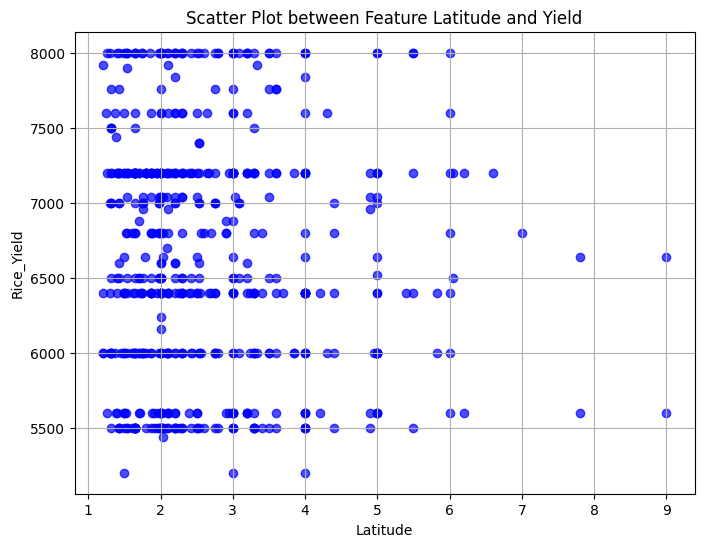

In [ ]:
import matplotlib.pyplot as plt

# Sample DataFrame with two features
# Replace "feature1" and "feature2" with the names of your columns
feature_x = data.iloc[: , 0]
feature_y = data['Rice Yield (kg/ha)']

# Create the plot
plt.figure(figsize=(8, 6))
plt.scatter(feature_x, feature_y, color='b', alpha=0.7)
plt.title("Scatter Plot between Feature Latitude and Yield")
plt.xlabel("Latitude")
plt.ylabel("Rice_Yield")
plt.grid(True)
plt.show()

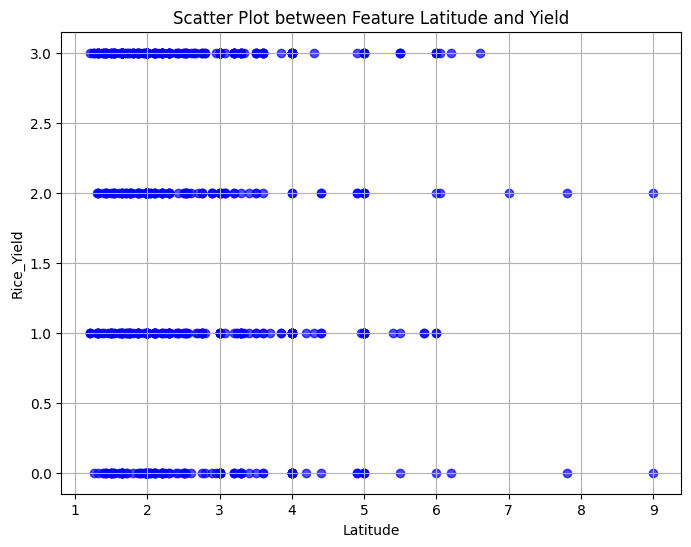

In [ ]:
import matplotlib.pyplot as plt

# Sample DataFrame with two features
# Replace "feature1" and "feature2" with the names of your columns
feature_x = data.iloc[: , 0]
feature_y = data['Class']

# Create the plot
plt.figure(figsize=(8, 6))
plt.scatter(feature_x, feature_y, color='b', alpha=0.7)
plt.title("Scatter Plot between Feature Latitude and Yield")
plt.xlabel("Latitude")
plt.ylabel("Rice_Yield")
plt.grid(True)
plt.show()

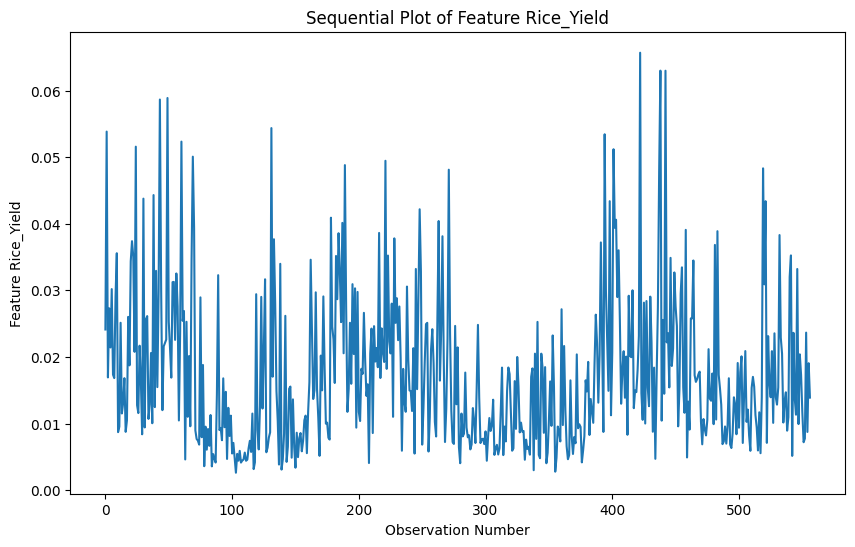

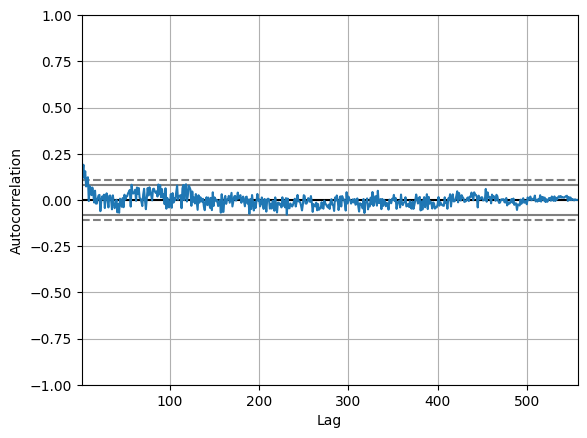

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import autocorrelation_plot

plt.figure(figsize=(10, 6))
plt.plot(data.iloc[:, 3])
plt.title("Sequential Plot of Feature Rice_Yield")
plt.xlabel("Observation Number")
plt.ylabel("Feature Rice_Yield")
plt.show()

autocorrelation_plot(data.iloc[:, 0])
plt.show()


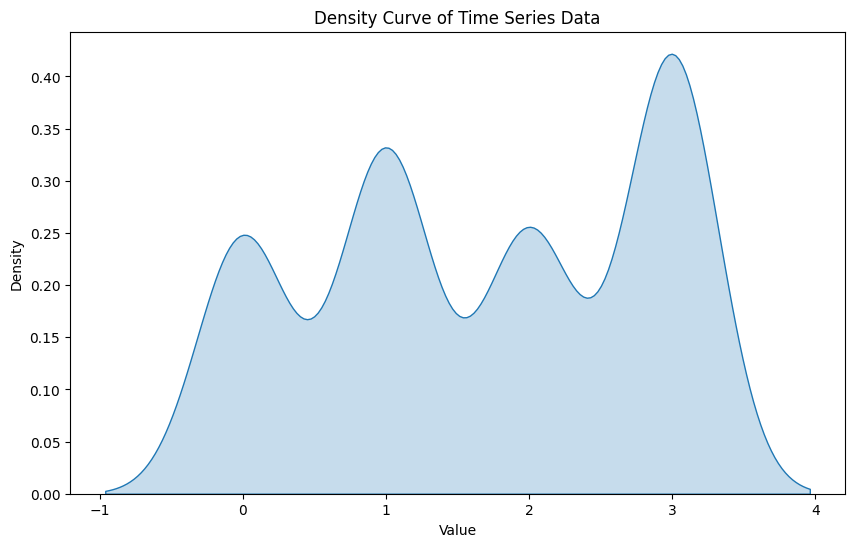

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' is your time series data as a pandas Series or column in DataFrame
plt.figure(figsize=(10, 6))
sns.kdeplot(Y, fill=True, bw_adjust=1)
plt.title("Density Curve of Time Series Data")
plt.xlabel("Value")
plt.ylabel("Density")
plt.show()

In [ ]:
import numpy as np

def augment_timeseries_data(X, Y, num_augmented_samples):
    augmented_X = []
    augmented_y = []

    # Get the original shape to maintain consistency
    original_sample_length = X.shape[1]

    for i in range(num_augmented_samples):
        # Select a random sample index from the dataset
        idx = np.random.randint(0, len(X))
        sample = X.loc[idx]

        # Augmentation Technique 1: Window slicing
        window_size = min(225, original_sample_length)  # Set window size within original length

        # Ensure enough data points for window slicing
        if sample.shape[0] >= window_size:
            start_idx = np.random.randint(0, sample.shape[0] - window_size + 1)
            sliced_sample = sample[start_idx:start_idx + window_size]

            # Pad sliced sample to original length if shorter
            if sliced_sample.shape[0] < original_sample_length:
                padding = np.zeros((original_sample_length - sliced_sample.shape[0],))
                sliced_sample = np.concatenate((sliced_sample, padding), axis=0)

        else:
            # Skip augmentation if sample is too short
            continue

        # Augmentation Technique 2: Jittering
        jitter_strength = 0.01  # Noise level
        jittered_sample = sliced_sample + np.random.normal(0, jitter_strength, size=sliced_sample.shape)

        # Augmentation Technique 3: Scaling
        scale_factor = np.random.uniform(0.8, 1.2)  # Scale between 80% and 120%
        scaled_sample = jittered_sample * scale_factor

        # Augmentation Technique 4: Time Warping
        warped_sample = np.interp(
            np.linspace(0, len(scaled_sample), num=len(scaled_sample)),
            np.arange(len(scaled_sample)),
            scaled_sample
        )

        # Reshape to ensure compatibility with original X dimensions
        warped_sample = warped_sample.reshape((1, original_sample_length))

        # Append augmented sample and label
        augmented_X.append(warped_sample)
        augmented_y.append(Y[idx])

    # Convert augmented data to numpy arrays and concatenate with original data
    augmented_X = np.vstack(augmented_X)  # Stack to match dimensions with original X
    augmented_y = np.array(augmented_y)

    # Combine original data with augmented data and return as X, Y
    X = np.concatenate((X, augmented_X), axis=0)
    Y = np.concatenate((Y, augmented_y), axis=0)

    return X, Y

# Example usage
# X is assumed to be a 2D numpy array of shape (samples, timesteps) and Y is the label array
num_augmented_samples = 10000  # Set number of new samples to generate
X, Y = augment_timeseries_data(X, Y, num_augmented_samples)

print("New Data Shape:", X.shape)
print("New Labels Shape:", Y.shape)


New Data Shape: (10557, 225)
New Labels Shape: (10557,)


In [ ]:
X = pd.DataFrame(X)
Y = pd.DataFrame(Y, columns=['Class'])

In [ ]:
X

,0,1,2,3,4,5,6,7,8,9,...,215,216,217,218,219,220,221,222,223,224
0,3.400000,0.078939,0.024129,0.005246,0.357296,0.059441,0.333167,0.054196,0.132912,0.026118,...,24.000000,23.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000
1,2.430000,0.012374,0.053835,0.016737,0.448553,0.136669,0.394718,0.119932,0.179150,0.051274,...,24.000000,23.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000
2,1.950000,0.186522,0.016936,0.010781,0.424133,0.114186,0.407197,0.103404,0.116764,0.030350,...,24.000000,23.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
3,4.300000,0.106439,0.027307,0.003393,0.335494,0.070942,0.308188,0.067549,0.111655,0.026225,...,24.000000,23.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000
4,3.300000,0.417298,0.021431,0.004080,0.226502,0.089368,0.205071,0.085289,0.114040,0.028807,...,24.000000,23.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10552,3.632408,0.193896,-0.002235,0.022243,0.508764,0.057383,0.476606,0.051555,0.109549,0.034290,...,39405.876122,1407.763359,-0.009841,0.007326,0.895662,0.893149,0.008550,0.003958,0.898084,0.902093
10553,2.036012,0.203198,0.018229,0.005521,0.266502,0.144715,0.222286,0.122873,0.112135,0.036972,...,36676.594725,1310.264625,0.016162,-0.013307,0.831869,0.019167,0.828469,-0.000727,0.837292,0.841084
10554,3.379573,0.205470,-0.001750,-0.014286,0.348960,0.073950,0.328750,0.065894,0.121219,0.032833,...,46619.344931,1665.714771,-0.010396,-0.013881,1.024220,0.019635,1.038405,0.023977,1.053099,1.057755
10555,2.939318,0.010672,0.033893,0.008655,0.351909,0.138121,0.342990,0.107776,0.119951,0.043999,...,40187.992958,1436.801316,0.036858,-0.007720,0.891522,0.008109,0.898220,0.022725,0.924484,0.928564


In [ ]:


Y

,Class
0,0.0
1,1.0
2,1.0
3,1.0
4,1.0
...,...
10552,0.0
10553,3.0
10554,3.0
10555,3.0


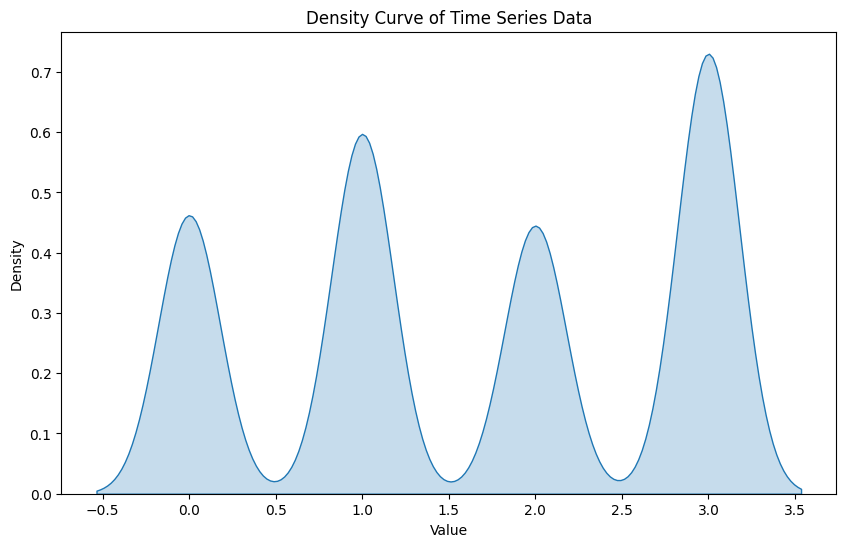

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.kdeplot(Y['Class'], fill=True, bw_adjust=1)
plt.title("Density Curve of Time Series Data")
plt.xlabel("Value")
plt.ylabel("Density")
plt.show()

In [ ]:
unique_values_column1 = data['Class'].unique()
print("Unique values in column1:", unique_values_column1)

Unique values in column1: [0. 1. 2. 3.]


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from tensorflow.keras.models import Model
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input, Layer
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping

class Attention(Layer):
    def __init__(self, **kwargs):
        super(Attention, self).__init__(**kwargs)

    def build(self, input_shape):
        self.W = self.add_weight(shape=(input_shape[-1], input_shape[-1]), initializer="glorot_uniform", trainable=True)
        self.b = self.add_weight(shape=(input_shape[-1],), initializer="zeros", trainable=True)
        self.u = self.add_weight(shape=(input_shape[-1], 1), initializer="glorot_uniform", trainable=True)

    def call(self, inputs):
        # Score computation
        scores = tf.tanh(tf.matmul(inputs, self.W) + self.b)  # (batch_size, time_steps, features)
        scores = tf.matmul(scores, self.u)  # (batch_size, time_steps, 1)

        # Normalize scores to obtain attention weights
        attention_weights = tf.nn.softmax(scores, axis=1)  # (batch_size, time_steps, 1)

        # Compute the context vector as the weighted average of inputs
        context_vector = attention_weights * inputs
        context_vector = tf.reduce_sum(context_vector, axis=1)  # (batch_size, features)

        return context_vector


In [ ]:
label_encoder = LabelEncoder()
Y_encoded = label_encoder.fit_transform(Y)
num_classes = len(label_encoder.classes_)
Y_one_hot = to_categorical(Y_encoded, num_classes=num_classes)

#scaler = StandardScaler()
#X_scaled = scaler.fit_transform(X)

#X_reshaped = X_scaled.reshape((X_scaled.shape[0], 1, X_scaled.shape[1]))

#X_train, X_test, Y_train, Y_test = train_test_split(X_reshaped, Y_one_hot, test_size=0.2, random_state=42)


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:110: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:

num_classes

4

In [ ]:
from sklearn.decomposition import PCA

#pca = PCA(n_components=80)  # Adjust 'n_components' as needed
#X_pca = pca.fit_transform(X_scaled)
# LSTM expects 3D input: [samples, timesteps, features]
#X_pca_reshaped = X_pca.reshape((X_pca.shape[0], 1, X_pca.shape[1]))

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=42)#0.2

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#pca = PCA(n_components=235)
pca = PCA(n_components=225)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)


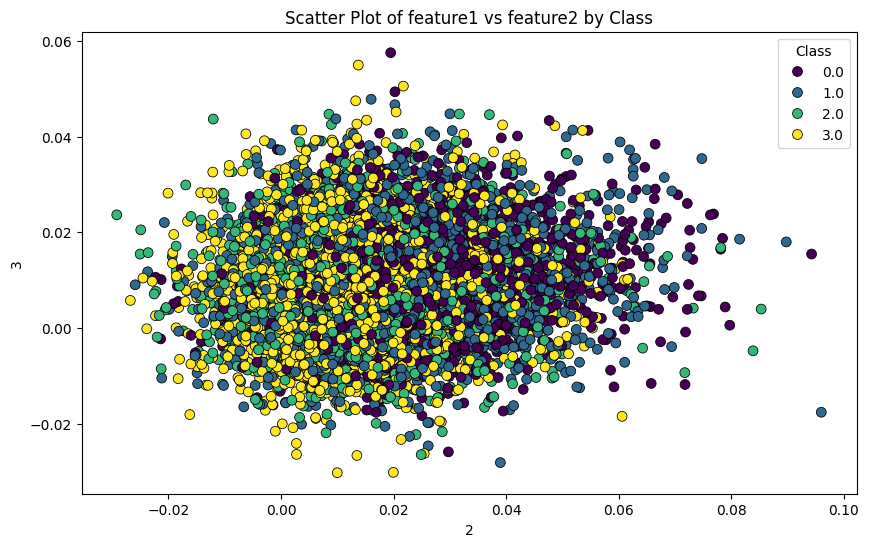

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming X is a DataFrame with feature columns, and Y is a Series with the target labels
# Choose two features for scatter plot (replace 'Feature1' and 'Feature2' with actual feature names)
feature1 = X.columns[2]  # Get the name of the first column
feature2 = X.columns[3]  # Get the name of the second column


# Combine features and target into a single DataFrame for easy plotting
data = pd.DataFrame({
    feature1: X[feature1],  # Use column names to access data
    feature2: X[feature2],  # Use column names to access data
    'Class': Y['Class']  # Access 'Class' column from Y
})

# Create the scatter plot with colors representing each class
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x=feature1, y=feature2, hue='Class', palette='viridis', s=50, edgecolor='k')
plt.title(f'Scatter Plot of feature1 vs feature2 by Class')
plt.xlabel(feature1)
plt.ylabel(feature2)
plt.legend(title='Class')
plt.show()

In [ ]:
X_train_pca.shape

(7389, 225)

In [ ]:
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
from tensorflow.keras import regularizers
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Bidirectional

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import neighbors
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
# from catboost import CatBoostClassifier
from sklearn.svm import SVC

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


**RANDOMFOREST CLASSIFIER**

In [ ]:
import tensorflow as tf
tf.random.set_seed(42)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import log_loss, classification_report, confusion_matrix, accuracy_score
import pandas as pd

rf_model = RandomForestClassifier(n_estimators=300, max_depth=70, random_state=42)

rf_model.fit(X_train_pca, Y_train)

Y_pred_proba = rf_model.predict_proba(X_test_pca)

Y_pred = rf_model.predict(X_test_pca)
accuracy = accuracy_score(Y_test, Y_pred)

print(f"Accuracy: {accuracy * 100:.2f}%")
print("Classification Report:")
print(classification_report(Y_test, Y_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Accuracy: 94.79%
Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      0.96      0.97       684
         1.0       0.95      0.94      0.95       879
         2.0       0.98      0.88      0.93       603
         3.0       0.91      0.99      0.95      1002

    accuracy                           0.95      3168
   macro avg       0.95      0.94      0.95      3168
weighted avg       0.95      0.95      0.95      3168



In [ ]:
test_score = accuracy_score(Y_test, rf_model.predict(X_test_pca)) * 100
train_score = accuracy_score(Y_train, rf_model.predict(X_train_pca)) * 100

results_df = pd.DataFrame(data=[["RANDOM FOREST", train_score, test_score]],
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,RANDOM FOREST,100.0,94.791667


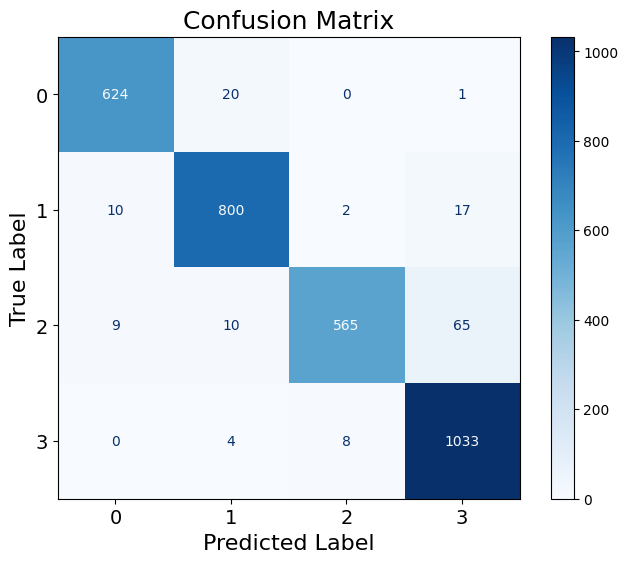

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Assuming Y_test and Y_pred are defined
cm = confusion_matrix(Y_test, Y_pred)

# Use a Matplotlib-compatible colormap
cmap = plt.get_cmap('Blues')

# Plot the confusion matrix with the selected color map
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(8, 6))  # Adjust figure size if needed
disp.plot(cmap=cmap, ax=ax)

# Increase font size
plt.rcParams.update({'font.size': 10})  # Set the font size globally
ax.tick_params(axis='both', labelsize=14)  # Increase tick label size
plt.xlabel('Predicted Label', fontsize=16)
plt.ylabel('True Label', fontsize=16)
plt.title('Confusion Matrix', fontsize=18)

plt.show()


**KNN**

In [ ]:
#KNeighborsClassifier
knn = neighbors.KNeighborsClassifier().fit(X_train_pca, Y_train)


Y_pred_proba = knn.predict_proba(X_test_pca)

Y_pred = knn.predict(X_test_pca)
accuracy = accuracy_score(Y_test, Y_pred)

print(f"Accuracy: {accuracy * 100:.2f}%")
print("KNN Classification Report:")
print(classification_report(Y_test, Y_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Accuracy: 74.87%
KNN Classification Report:
              precision    recall  f1-score   support

         0.0       0.71      0.85      0.77       615
         1.0       0.78      0.69      0.74       866
         2.0       0.67      0.56      0.61       643
         3.0       0.79      0.85      0.82      1044

    accuracy                           0.75      3168
   macro avg       0.74      0.74      0.73      3168
weighted avg       0.75      0.75      0.74      3168



In [ ]:
test_score = accuracy_score(Y_test, knn.predict(X_test_pca)) * 100
train_score = accuracy_score(Y_train, knn.predict(X_train_pca)) * 100

results_df_2 = pd.DataFrame(data=[["KNeighbors", train_score, test_score]],
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = pd.concat([results_df, results_df_2], ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,RANDOM FOREST,100.000000,95.107323
1,KNeighbors,85.072405,74.873737


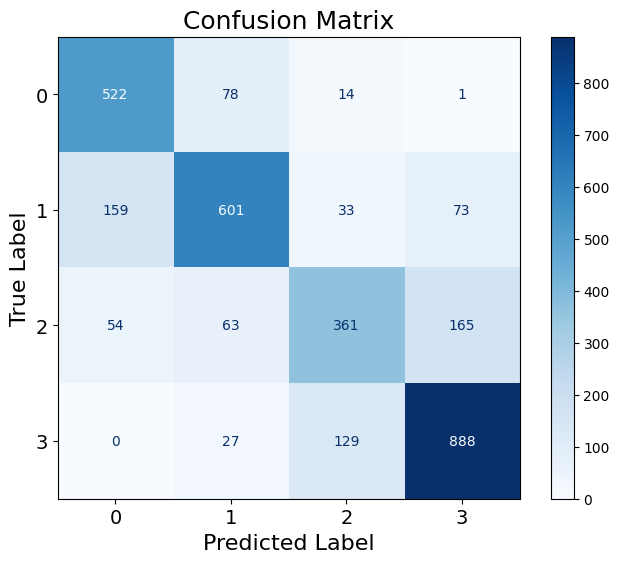

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Assuming Y_test and Y_pred are defined
cm = confusion_matrix(Y_test, Y_pred)

# Use a Matplotlib-compatible colormap
cmap = plt.get_cmap('Blues')

# Plot the confusion matrix with the selected color map
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(8, 6))  # Adjust figure size if needed
disp.plot(cmap=cmap, ax=ax)

# Increase font size
plt.rcParams.update({'font.size': 10})  # Set the font size globally
ax.tick_params(axis='both', labelsize=14)  # Increase tick label size
plt.xlabel('Predicted Label', fontsize=16)
plt.ylabel('True Label', fontsize=16)
plt.title('Confusion Matrix', fontsize=18)

plt.show()

**LogisticRegression**

In [ ]:
lr = LogisticRegression(solver='liblinear')

lr.fit(X_train_pca, Y_train)

Y_pred_proba = lr.predict_proba(X_test_pca)

Y_pred = lr.predict(X_test_pca)
accuracy = accuracy_score(Y_test, Y_pred)

print(f"Accuracy: {accuracy * 100:.2f}%")
print("LR Classification Report:")
print(classification_report(Y_test, Y_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 66.32%
LR Classification Report:
              precision    recall  f1-score   support

         0.0       0.70      0.72      0.71       615
         1.0       0.63      0.64      0.63       866
         2.0       0.59      0.18      0.27       643
         3.0       0.68      0.95      0.79      1044

    accuracy                           0.66      3168
   macro avg       0.65      0.62      0.60      3168
weighted avg       0.65      0.66      0.63      3168



In [ ]:
test_score = accuracy_score(Y_test, lr.predict(X_test_pca)) * 100
train_score = accuracy_score(Y_train, lr.predict(X_train_pca)) * 100

results_df_2 = pd.DataFrame(data=[["LogisticRegression", train_score, test_score]],
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = pd.concat([results_df, results_df_2], ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,RANDOM FOREST,100.000000,95.107323
1,KNeighbors,85.072405,74.873737
2,LogisticRegression,67.668155,66.319444


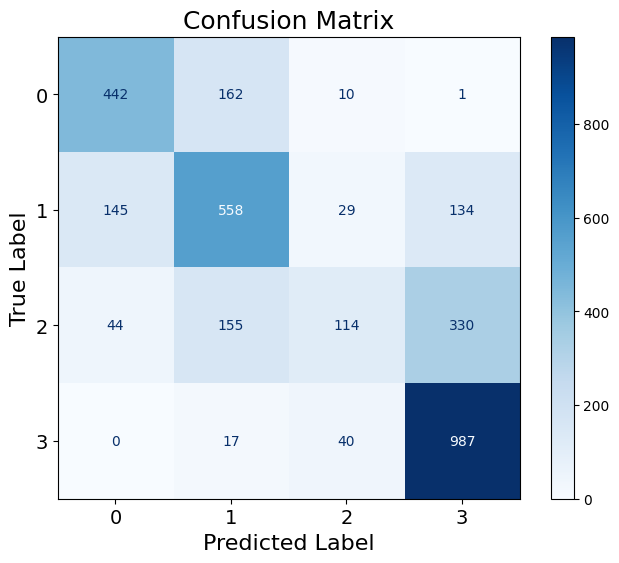

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Assuming Y_test and Y_pred are defined
cm = confusion_matrix(Y_test, Y_pred)

# Use a Matplotlib-compatible colormap
cmap = plt.get_cmap('Blues')

# Plot the confusion matrix with the selected color map
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(8, 6))  # Adjust figure size if needed
disp.plot(cmap=cmap, ax=ax)

# Increase font size
plt.rcParams.update({'font.size': 10})  # Set the font size globally
ax.tick_params(axis='both', labelsize=14)  # Increase tick label size
plt.xlabel('Predicted Label', fontsize=16)
plt.ylabel('True Label', fontsize=16)
plt.title('Confusion Matrix', fontsize=18)

plt.show()

**SVM**

In [ ]:
svm = SVC(kernel='rbf', gamma=0.1, C=1.0, probability=True) # Set probability=True

svm.fit(X_train_pca, Y_train)

Y_pred_proba = svm.predict_proba(X_test_pca)

Y_pred = svm.predict(X_test_pca)
accuracy = accuracy_score(Y_test, Y_pred)

print(f"Accuracy: {accuracy * 100:.2f}%")
print("svm Classification Report:")
print(classification_report(Y_test, Y_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 80.59%
svm Classification Report:
              precision    recall  f1-score   support

         0.0       0.89      0.81      0.85       653
         1.0       0.79      0.84      0.81       788
         2.0       0.80      0.53      0.64       649
         3.0       0.78      0.95      0.86      1078

    accuracy                           0.81      3168
   macro avg       0.82      0.78      0.79      3168
weighted avg       0.81      0.81      0.80      3168



In [ ]:
test_score = accuracy_score(Y_test, svm.predict(X_test_pca)) * 100
train_score = accuracy_score(Y_train, svm.predict(X_train_pca)) * 100

results_df_2 = pd.DataFrame(data=[["Support Vector Machine", train_score, test_score]],
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = pd.concat([results_df, results_df_2], ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,RANDOM FOREST,100.000000,94.854798
1,Support Vector Machine,91.906889,80.587121


**DecisionTreeClassifier**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
tree_clf = DecisionTreeClassifier(random_state=42)

tree_clf.fit(X_train_pca, Y_train)

Y_pred_proba = tree_clf.predict_proba(X_test_pca)

Y_pred = tree_clf.predict(X_test_pca)
accuracy = accuracy_score(Y_test, Y_pred)

print(f"Accuracy: {accuracy * 100:.2f}%")
print("Classification Report:")
print(classification_report(Y_test, Y_pred))

Accuracy: 84.82%
Classification Report:
              precision    recall  f1-score   support

         0.0       0.85      0.89      0.87       615
         1.0       0.85      0.83      0.84       866
         2.0       0.80      0.76      0.78       643
         3.0       0.87      0.90      0.89      1044

    accuracy                           0.85      3168
   macro avg       0.84      0.84      0.84      3168
weighted avg       0.85      0.85      0.85      3168



In [ ]:
test_score = accuracy_score(Y_test, tree_clf.predict(X_test_pca)) * 100
train_score = accuracy_score(Y_train, tree_clf.predict(X_train_pca)) * 100

results_df_2 = pd.DataFrame(data=[["Decision Tree Classifier", train_score, test_score]],
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = pd.concat([results_df, results_df_2], ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,RANDOM FOREST,100.000000,95.107323
1,KNeighbors,85.072405,74.873737
2,LogisticRegression,67.668155,66.319444
3,Decision Tree Classifier,100.000000,84.816919


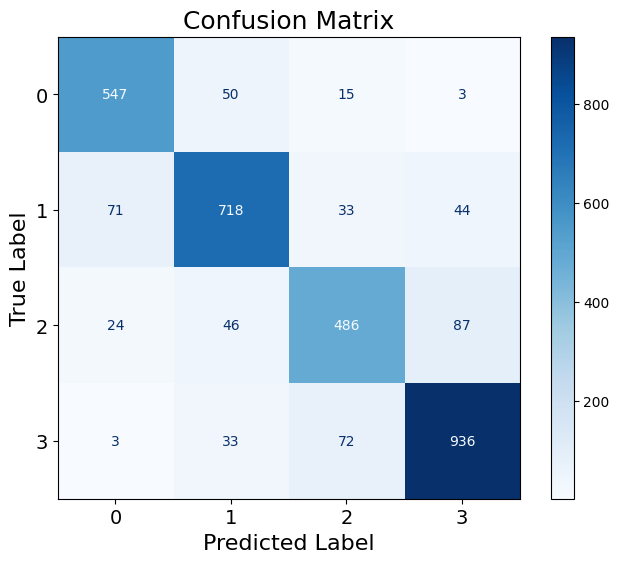

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Assuming Y_test and Y_pred are defined
cm = confusion_matrix(Y_test, Y_pred)

# Use a Matplotlib-compatible colormap
cmap = plt.get_cmap('Blues')

# Plot the confusion matrix with the selected color map
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(8, 6))  # Adjust figure size if needed
disp.plot(cmap=cmap, ax=ax)

# Increase font size
plt.rcParams.update({'font.size': 10})  # Set the font size globally
ax.tick_params(axis='both', labelsize=14)  # Increase tick label size
plt.xlabel('Predicted Label', fontsize=16)
plt.ylabel('True Label', fontsize=16)
plt.title('Confusion Matrix', fontsize=18)

plt.show()

**GaussianNB**

In [ ]:
#GaussianNB
gnb = GaussianNB()

gnb.fit(X_train_pca, Y_train)

Y_pred_proba = gnb.predict_proba(X_test_pca)

Y_pred = gnb.predict(X_test_pca)
accuracy = accuracy_score(Y_test, Y_pred)

print(f"Accuracy: {accuracy * 100:.2f}%")
print("Classification Report:")
print(classification_report(Y_test, Y_pred))

Accuracy: 43.91%
Classification Report:
              precision    recall  f1-score   support

         0.0       0.50      0.19      0.28       615
         1.0       0.46      0.25      0.33       866
         2.0       0.36      0.20      0.26       643
         3.0       0.44      0.89      0.59      1044

    accuracy                           0.44      3168
   macro avg       0.44      0.38      0.36      3168
weighted avg       0.44      0.44      0.39      3168



/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
test_score = accuracy_score(Y_test, gnb.predict(X_test_pca)) * 100
train_score = accuracy_score(Y_train, gnb.predict(X_train_pca)) * 100

results_df_2 = pd.DataFrame(data=[["GaussianNB", train_score, test_score]],
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = pd.concat([results_df, results_df_2], ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,RANDOM FOREST,100.000000,95.107323
1,KNeighbors,85.072405,74.873737
2,LogisticRegression,67.668155,66.319444
3,Decision Tree Classifier,100.000000,84.816919
4,GaussianNB,45.378265,43.907828


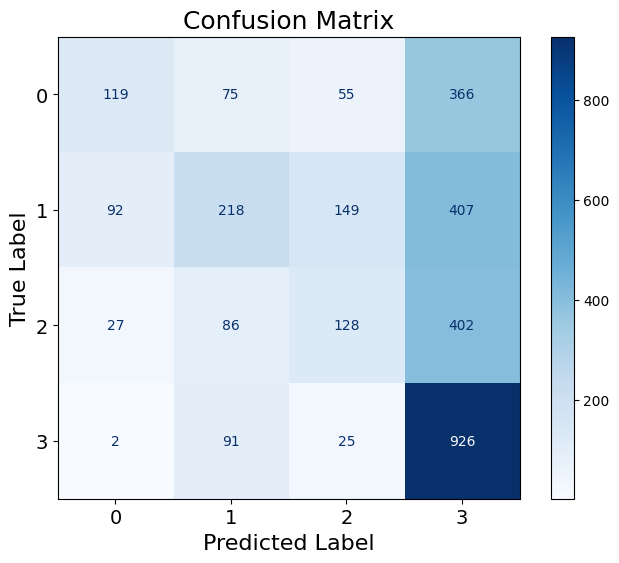

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Assuming Y_test and Y_pred are defined
cm = confusion_matrix(Y_test, Y_pred)

# Use a Matplotlib-compatible colormap
cmap = plt.get_cmap('Blues')

# Plot the confusion matrix with the selected color map
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(8, 6))  # Adjust figure size if needed
disp.plot(cmap=cmap, ax=ax)

# Increase font size
plt.rcParams.update({'font.size': 10})  # Set the font size globally
ax.tick_params(axis='both', labelsize=14)  # Increase tick label size
plt.xlabel('Predicted Label', fontsize=16)
plt.ylabel('True Label', fontsize=16)
plt.title('Confusion Matrix', fontsize=18)

plt.show()

**GradientBoostingClassifier**

In [ ]:
gbc= GradientBoostingClassifier()

gbc.fit(X_train_pca, Y_train)

Y_pred_proba = gbc.predict_proba(X_test_pca)

Y_pred = gbc.predict(X_test_pca)
accuracy = accuracy_score(Y_test, Y_pred)

print(f"Accuracy: {accuracy * 100:.2f}%")
print("Classification Report:")
print(classification_report(Y_test, Y_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:110: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 87.59%
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.90      0.91       615
         1.0       0.89      0.88      0.88       866
         2.0       0.92      0.69      0.79       643
         3.0       0.83      0.98      0.90      1044

    accuracy                           0.88      3168
   macro avg       0.89      0.86      0.87      3168
weighted avg       0.88      0.88      0.87      3168



In [ ]:
test_score = accuracy_score(Y_test, gbc.predict(X_test_pca)) * 100
train_score = accuracy_score(Y_train, gbc.predict(X_train_pca)) * 100

results_df_2 = pd.DataFrame(data=[["GradientBoosting", train_score, test_score]],
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = pd.concat([results_df, results_df_2], ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,RANDOM FOREST,100.000000,95.107323
1,KNeighbors,85.072405,74.873737
2,LogisticRegression,67.668155,66.319444
3,Decision Tree Classifier,100.000000,84.816919
4,GaussianNB,45.378265,43.907828
5,GradientBoosting,94.126404,87.594697


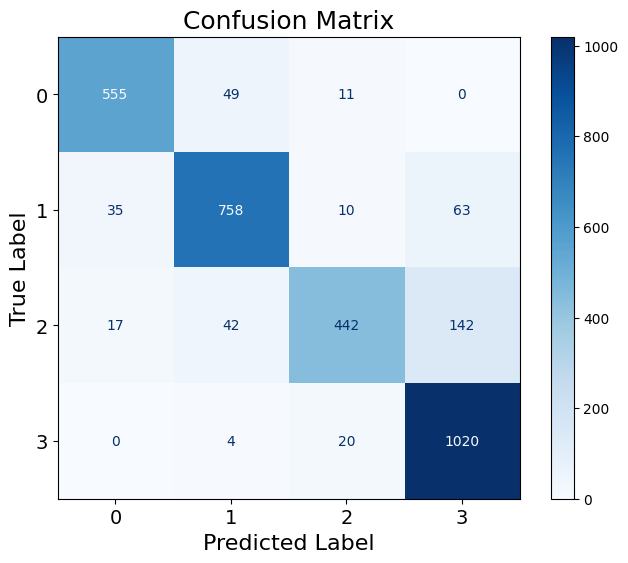

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Assuming Y_test and Y_pred are defined
cm = confusion_matrix(Y_test, Y_pred)

# Use a Matplotlib-compatible colormap
cmap = plt.get_cmap('Blues')

# Plot the confusion matrix with the selected color map
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(8, 6))  # Adjust figure size if needed
disp.plot(cmap=cmap, ax=ax)

# Increase font size
plt.rcParams.update({'font.size': 10})  # Set the font size globally
ax.tick_params(axis='both', labelsize=14)  # Increase tick label size
plt.xlabel('Predicted Label', fontsize=16)
plt.ylabel('True Label', fontsize=16)
plt.title('Confusion Matrix', fontsize=18)

plt.show()

In [ ]:
# Reshape X_train_pca to 3D for LSTM
# Assuming having a time dimension of 1, and the features are the columns of your DataFrame
X_train_pca = X_train_pca.reshape(X_train_pca.shape[0], 1, X_train_pca.shape[1])

X_test_pca = X_test_pca.reshape(X_test_pca.shape[0], 1, X_test_pca.shape[1])

In [ ]:
Y_train = tf.keras.utils.to_categorical(Y_train, num_classes=4)

Y_test = tf.keras.utils.to_categorical(Y_test, num_classes=4)

**1. CNN + LSTM + Attention Hybrid Model:**

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv1D, LSTM, Attention, Dense, Dropout, BatchNormalization, Input, Flatten # Import Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers

# Model architecture
input_layer = Input(shape=(X_train_pca.shape[1], X_train_pca.shape[2]))

# CNN Layer without MaxPooling1D
# Changed padding to 'same' to avoid negative dimension error
cnn_layer = Conv1D(filters=32, kernel_size=1, activation='relu', padding='same')(input_layer)

# LSTM Layer
lstm_layer = LSTM(80, return_sequences=True, kernel_regularizer=regularizers.l2(0.001))(cnn_layer)

# Batch Normalization
bn_layer = BatchNormalization()(lstm_layer)

# Attention Layer
# The Attention layer requires a query and value input.
# In this case, we are using the output of the LSTM layer as both the query and value.
# You may need to adjust this based on your specific use case.
attention_layer = Attention()([bn_layer, bn_layer])

# Flatten the output of the Attention layer
flatten_layer = Flatten()(attention_layer) # Added Flatten layer

# Dropout Layer
dropout_layer = Dropout(0.3)(flatten_layer) # Connect Dropout to Flatten

# Output Layer
output_layer = Dense(4, activation='softmax', kernel_regularizer=regularizers.l2(0.001))(dropout_layer) # Connect Dense to Dropout

# Model definition
model_hybrid1 = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
model_hybrid1.compile(optimizer=Adam(learning_rate=0.0005), loss='categorical_crossentropy', metrics=['accuracy'])

# Early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model_hybrid1.fit(X_train_pca, Y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=1, callbacks=[early_stopping])

test_loss, test_accuracy = model_hybrid1.evaluate(X_test_pca, Y_test, verbose=1)
print(f'Test Accuracy: {test_accuracy}')

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


185/185 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.4863 - loss: 1.3453 - val_accuracy: 0.5237 - val_loss: 1.2761
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.5790 - loss: 1.0360 - val_accuracy: 0.6164 - val_loss: 1.0789
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.6042 - loss: 0.9316 - val_accuracy: 0.6319 - val_loss: 0.8875
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6295 - loss: 0.8680 - val_accuracy: 0.6563 - val_loss: 0.8043
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6653 - loss: 0.8094 - val_accuracy: 0.6779 - val_loss: 0.7685
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6696 - loss: 0.7674 - val_accuracy: 0.6901 - val_loss: 0.7330
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6980 - loss: 0.7135 - val_accuracy: 0.7003 - val_loss: 0.7031
Epoch 8/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7130 - loss: 0.6817 - val_accuracy: 0.71

In [ ]:
train_loss, train_accuracy = model_hybrid1.evaluate(X_train_pca, Y_train, verbose=1)
print(f'Train Accuracy: {train_accuracy}')

231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9747 - loss: 0.1143
Train Accuracy: 0.9692786335945129


In [ ]:
input_layer.shape

(None, 1, 235)

In [ ]:
cnn_layer.shape

(None, 1, 32)

In [ ]:
lstm_layer.shape

(None, 1, 80)

In [ ]:
flatten_layer.shape

(None, 80)

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


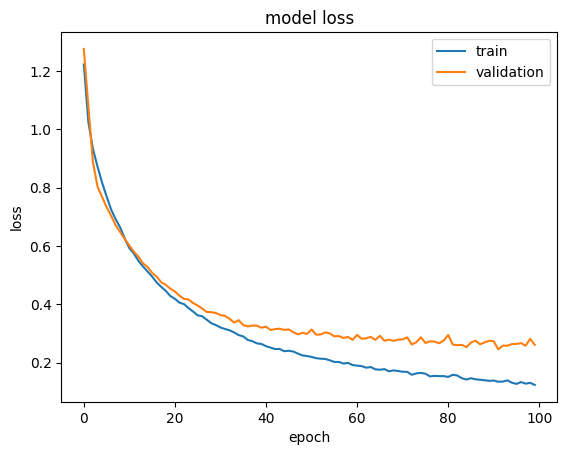

In [ ]:
from matplotlib import pyplot as plt

# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

**LSTM+Attention**

In [ ]:
# Model architecture
input_layer = Input(shape=(1, X_train_pca.shape[2]))
lstm_layer = LSTM(123, return_sequences=True, kernel_regularizer=regularizers.l2(0.001))(input_layer)



#lstm_layer = Bidirectional(LSTM(150, return_sequences=True, kernel_regularizer=regularizers.l2(0.001)))(input_layer)
bn_layer = BatchNormalization()(lstm_layer)

attention_layer = Attention(name="attention")([bn_layer, bn_layer])
attention_layer = Flatten()(attention_layer)

dropout_layer = Dropout(0.3)(attention_layer)

output_layer = Dense(4, activation='softmax', kernel_regularizer=regularizers.l2(0.001))(dropout_layer)


model_6= Model(inputs=input_layer, outputs=output_layer)

# Compile the model
model_6.compile(optimizer=Adam(learning_rate=0.0005), loss='categorical_crossentropy', metrics=['accuracy']) #0.0005=0.625

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model_6.fit(X_train_pca, Y_train, epochs = 100, batch_size = 32, validation_split = 0.2, verbose = 1, callbacks=[early_stopping])

test_loss, test_accuracy = model_6.evaluate(X_test_pca, Y_test, verbose=1)
print(f'Test Accuracy: {test_accuracy}')
print(f'Test Loss: {test_loss}')

Epoch 1/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.4797 - loss: 1.5560 - val_accuracy: 0.6265 - val_loss: 1.1433
Epoch 2/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5961 - loss: 1.0057 - val_accuracy: 0.6414 - val_loss: 0.9116
Epoch 3/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6335 - loss: 0.9070 - val_accuracy: 0.6813 - val_loss: 0.7900
Epoch 4/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6444 - loss: 0.8510 - val_accuracy: 0.7091 - val_loss: 0.7493
Epoch 5/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6734 - loss: 0.8037 - val_accuracy: 0.7111 - val_loss: 0.7198
Epoch 6/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6949 - loss: 0.7585 - val_accuracy: 0.7280 - val_loss: 0.6979
Epoch 7/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7015 - loss: 0.7380 - val_accuracy: 0.7415 - val_loss: 0.6743
Epoch 8/100
185/185 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7096 - loss: 0.7081 - val_accu

In [ ]:
train_loss, train_accuracy = model_6.evaluate(X_train_pca, Y_train, verbose=1)
print(f'Train Accuracy: {train_accuracy}')

231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9129 - loss: 0.3400
Train Accuracy: 0.9044525623321533


In [ ]:
model_6.predict(X_test_pca)

 9/99 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step   

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (32, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


99/99 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


array([[5.3193523e-03, 9.9467343e-01, 2.1289100e-06, 5.0931271e-06],
       [1.2363840e-03, 1.2102973e-02, 4.4708839e-01, 5.3957224e-01],
       [9.9918371e-01, 7.7871885e-04, 2.8122589e-05, 9.4255129e-06],
       ...,
       [2.6110724e-01, 1.9602939e-02, 7.1880269e-01, 4.8712167e-04],
       [1.4064168e-03, 1.6602892e-02, 1.4633486e-01, 8.3565581e-01],
       [1.0029302e-02, 9.8727393e-01, 1.9307331e-03, 7.6603558e-04]],
      dtype=float32)

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


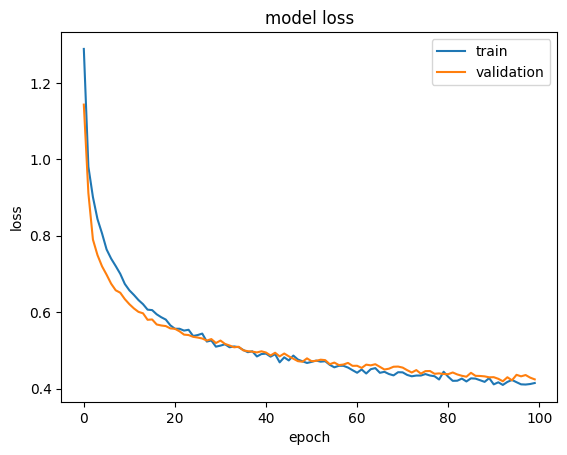

In [ ]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

**4. GRU + Attention + Dense Hybrid Model:**

In [ ]:
from tensorflow.keras.layers import GRU

# Model architecture
input_layer = Input(shape=(X_train_pca.shape[1], X_train_pca.shape[2]))

# GRU Layer
gru_layer = GRU(100, return_sequences=True, kernel_regularizer=regularizers.l2(0.001))(input_layer)

# Attention Layer
attention_layer = Attention()([gru_layer, gru_layer])

attention_layer = Flatten()(attention_layer)

# Dropout Layer
dropout_layer = Dropout(0.3)(attention_layer)

# Output Layer
output_layer = Dense(4, activation='softmax', kernel_regularizer=regularizers.l2(0.001))(dropout_layer)

# Model definition
model_hybrid4 = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
model_hybrid4.compile(optimizer=Adam(learning_rate=0.0005), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model_hybrid4.fit(X_train_pca, Y_train, epochs=100, batch_size=8, validation_split=0.2, verbose=1)#, callbacks=[early_stopping])

test_loss, test_accuracy = model_hybrid4.evaluate(X_test_pca, Y_test, verbose=1)
print(f'Test Accuracy: {test_accuracy}')

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


739/739 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.5228 - loss: 1.1922 - val_accuracy: 0.6286 - val_loss: 0.8747
Epoch 2/100
739/739 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.6275 - loss: 0.8738 - val_accuracy: 0.6360 - val_loss: 0.8318
Epoch 3/100
739/739 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.6429 - loss: 0.8287 - val_accuracy: 0.6610 - val_loss: 0.8050
Epoch 4/100
739/739 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.6612 - loss: 0.7935 - val_accuracy: 0.6847 - val_loss: 0.7891
Epoch 5/100
739/739 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.6652 - loss: 0.7796 - val_accuracy: 0.6955 - val_loss: 0.7716
Epoch 6/100
739/739 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.6775 - loss: 0.7685 - val_accuracy: 0.7050 - val_loss: 0.7577
Epoch 7/100
739/739 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.6864 - loss: 0.7466 - val_accuracy: 0.7145 - val_loss: 0.7427
Epoch 8/100
739/739 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.7101 - loss: 0.7364 - val_accuracy: 0.

In [ ]:
train_loss, train_accuracy = model_hybrid4.evaluate(X_train_pca, Y_train, verbose=1)
print(f'Train Accuracy: {train_accuracy}')

231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8710 - loss: 0.5147
Train Accuracy: 0.8643929958343506


dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


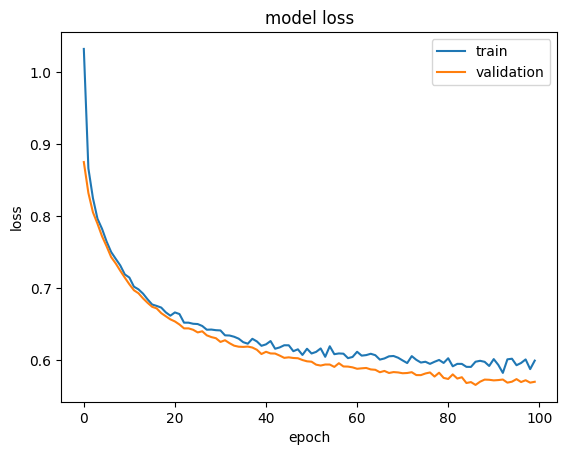

In [ ]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [ ]:
Y_test.shape

(3168, 4)

In [ ]:
preds_model_hybrid1 = model_hybrid1.predict(X_test_pca)
#preds_model_hybrid2 = model_hybrid2.predict(X_test)
#preds_model_hybrid3 = model_hybrid3.predict(X_test)
preds_model_hybrid4 = model_hybrid4.predict(X_test_pca)
#preds_model_hybrid5 = model_hybrid5.predict(X_test)
preds_model_6 = model_6.predict(X_test_pca)

ensemble_preds = (preds_model_hybrid1 +  preds_model_6 )/3

# Convert probabilities to class labels
ensemble_class_preds = np.argmax(ensemble_preds, axis=1)

true_class_labels = np.argmax(Y_test, axis=1)
accuracy = accuracy_score(true_class_labels, ensemble_class_preds)
print(f'Ensemble Model Accuracy: {accuracy:.4f}')

In [ ]:
preds_model_hybrid1

In [ ]:
Y_pred = ensemble_preds
Y_pred_classes = np.argmax(Y_pred, axis=1)
Y_test_classes = np.argmax(Y_test, axis=1)


In [ ]:
Y_test_classes

In [ ]:
Y_pred_classes

**XAI IN TRAIN DATASET**

In [ ]:
!pip install shap
import shap

In [ ]:
X_train.shape

(7389, 235)

In [ ]:
explainer = shap.TreeExplainer(rf_model)
shap_values = explainer.shap_values(X_train_scaled[:100])

if hasattr(explainer, 'expected_value'):
   expected_value = explainer.expected_value
else:
    expected_value = np.mean(ensemble_preds.predict(X_train_scaled))
shap_values_4_classes = shap_values[:, :, :4]
expected_value_4_classes = expected_value[:4]

In [ ]:
shap_values.shape

(100, 235, 4)

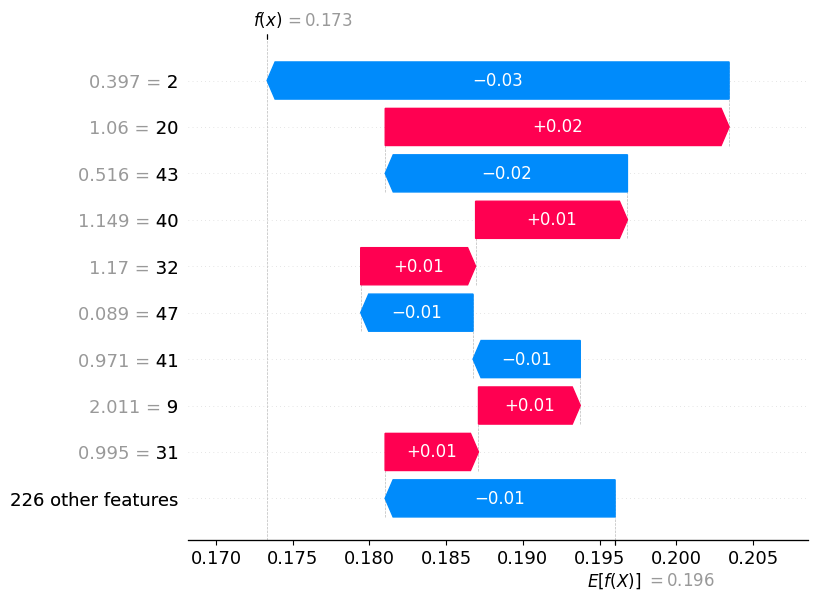

In [ ]:
#waterfall plot for 1st observation and 1st output
import pandas as pd #Import pandas

#Convert X_train_scaled to pandas DataFrame if it is not already
X_train_scaled_df = pd.DataFrame(X_train_scaled)

# Ensure all feature names are strings
X_train_scaled_df.columns = X_train_scaled_df.columns.astype(str)

#Select shap values for the first instance and first output
shap_values_for_waterfall = shap_values[0, :, 0] # Select first instance, all features, first output


shap_values_explanation = shap.Explanation(
    values=shap_values_for_waterfall,
    base_values=explainer.expected_value[0],  # Select expected value for the first output
    data=X_train_scaled_df.iloc[0],  # Access data using .iloc on the DataFrame
    feature_names=X_train_scaled_df.columns # Assuming X_train_scaled is a pandas DataFrame
)

# Plot the waterfall plot
shap.plots.waterfall(shap_values_explanation)

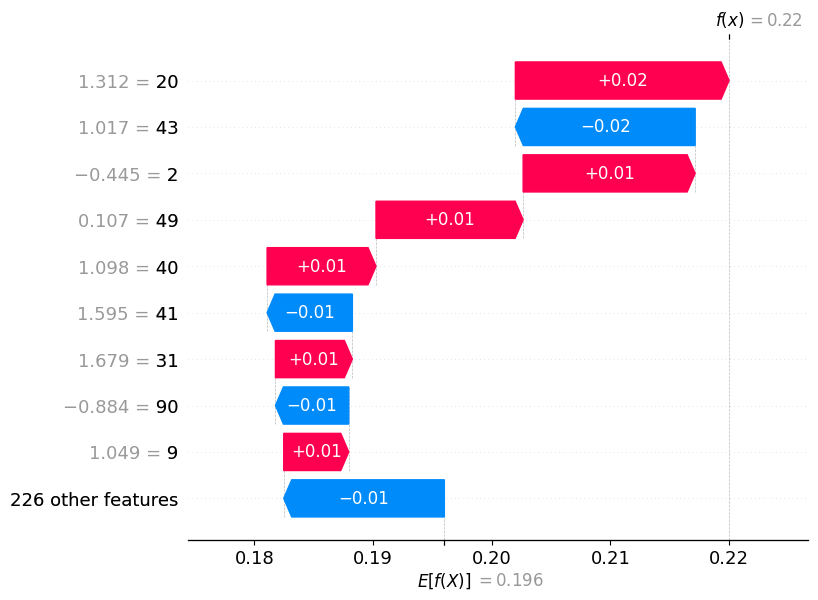

In [ ]:
#waterfall plot for second instance and the first output class
import shap #import the shap library

# Assuming X_train_scaled is a pandas DataFrame or a NumPy array
# Convert to pandas DataFrame if it is a NumPy array
import pandas as pd
if not isinstance(X_train_scaled, pd.DataFrame):
    X_train_scaled = pd.DataFrame(X_train_scaled)

# Ensure all feature names are strings
X_train_scaled.columns = X_train_scaled.columns.astype(str)

# Assuming rf_model is your trained model
# Create an Explanation object for the second observation (index 1) and the first output class (index 0)
shap_values_explanation = shap.Explanation(
    values=shap_values[1, :, 0],  # SHAP values for the second observation and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_train_scaled.iloc[1],  # Feature values for the second observation
    feature_names=X_train_scaled.columns  # Feature names
)

# Plot the waterfall plot
shap.plots.waterfall(shap_values_explanation)

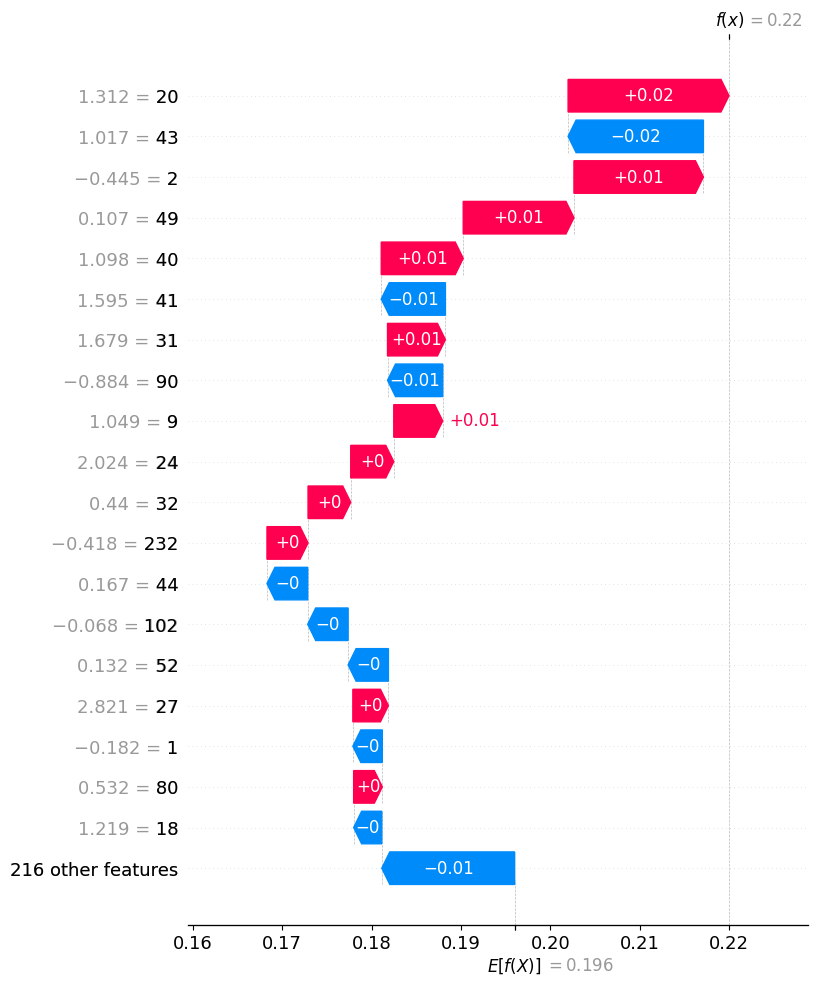

In [ ]:
#waterfall plot for the second observation and the first output class
import shap #import the shap library

# Assuming X_train_scaled is a pandas DataFrame or a NumPy array
# Convert to pandas DataFrame if it is a NumPy array
import pandas as pd
if not isinstance(X_train_scaled, pd.DataFrame):
    X_train_scaled = pd.DataFrame(X_train_scaled)

# Ensure all feature names are strings
X_train_scaled.columns = X_train_scaled.columns.astype(str)

# Assuming rf_model is your trained model
# Create an Explanation object for the second observation (index 1) and the first output class (index 0)
shap_values_explanation = shap.Explanation(
    values=shap_values[1, :, 0],  # SHAP values for the second observation and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_train_scaled.iloc[1],  # Feature values for the second observation
    feature_names=X_train_scaled.columns  # Feature names
)

# Plot the waterfall plot
shap.plots.waterfall(shap_values_explanation, max_display=20) # Pass the Explanation object and max_display

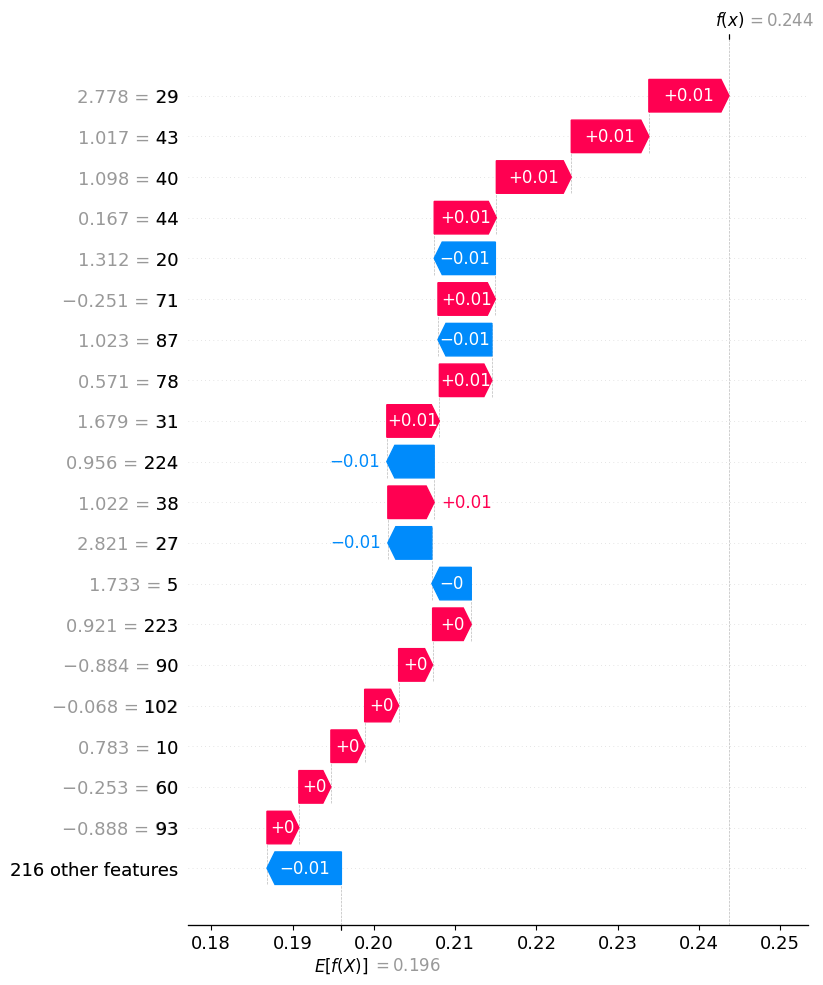

In [ ]:
#waterfall plot for the second observation and the 2nd output class
import shap #import the shap library

# Assuming X_train_scaled is a pandas DataFrame or a NumPy array
# Convert to pandas DataFrame if it is a NumPy array
import pandas as pd
if not isinstance(X_train_scaled, pd.DataFrame):
    X_train_scaled = pd.DataFrame(X_train_scaled)

# Ensure all feature names are strings
X_train_scaled.columns = X_train_scaled.columns.astype(str)

# Assuming rf_model is your trained model
# Create an Explanation object for the second observation (index 1) and the first output class (index 0)
shap_values_explanation = shap.Explanation(
    values=shap_values[1, :, 1],  # SHAP values for the second observation and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_train_scaled.iloc[1],  # Feature values for the second observation
    feature_names=X_train_scaled.columns  # Feature names
)

# Plot the waterfall plot
shap.plots.waterfall(shap_values_explanation, max_display=20) # Pass the Explanation object and max_display

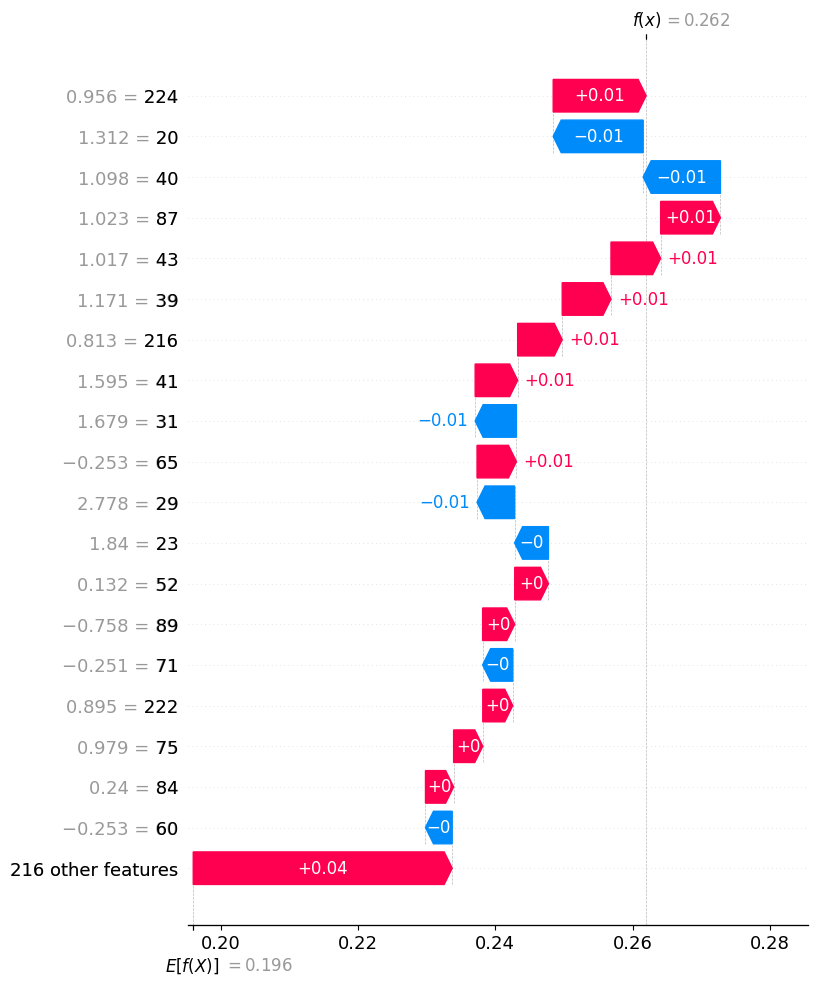

In [ ]:
#waterfall plot for the second observation and the 3rd output class
import shap #import the shap library

# Assuming X_train_scaled is a pandas DataFrame or a NumPy array
# Convert to pandas DataFrame if it is a NumPy array
import pandas as pd
if not isinstance(X_train_scaled, pd.DataFrame):
    X_train_scaled = pd.DataFrame(X_train_scaled)

# Ensure all feature names are strings
X_train_scaled.columns = X_train_scaled.columns.astype(str)

# Assuming rf_model is your trained model
# Create an Explanation object for the second observation (index 1) and the first output class (index 0)
shap_values_explanation = shap.Explanation(
    values=shap_values[1, :, 2],  # SHAP values for the second observation and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_train_scaled.iloc[1],  # Feature values for the second observation
    feature_names=X_train_scaled.columns  # Feature names
)

# Plot the waterfall plot
shap.plots.waterfall(shap_values_explanation, max_display=20) # Pass the Explanation object and max_display

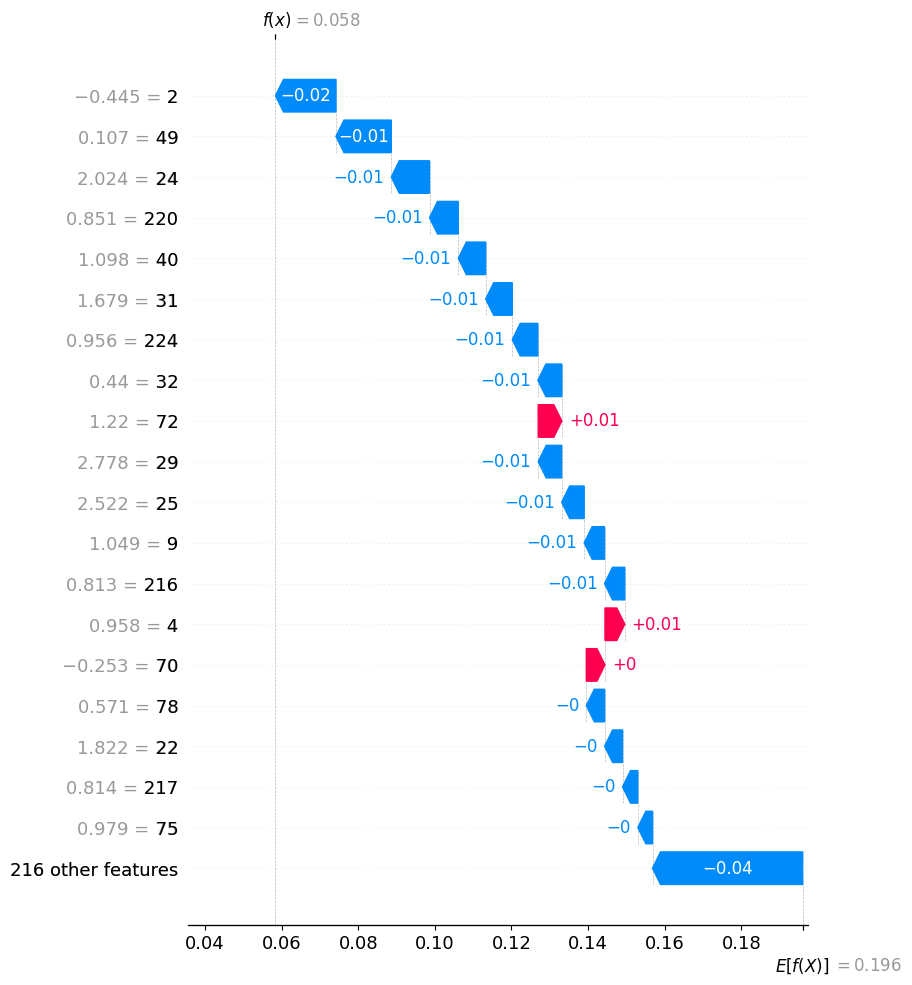

In [ ]:
#waterfall plot for the second observation and the 4th output class
import shap #import the shap library

# Assuming X_train_scaled is a pandas DataFrame or a NumPy array
# Convert to pandas DataFrame if it is a NumPy array
import pandas as pd
if not isinstance(X_train_scaled, pd.DataFrame):
    X_train_scaled = pd.DataFrame(X_train_scaled)

# Ensure all feature names are strings
X_train_scaled.columns = X_train_scaled.columns.astype(str)

# Assuming rf_model is your trained model
# Create an Explanation object for the second observation (index 1) and the first output class (index 0)
shap_values_explanation = shap.Explanation(
    values=shap_values[1, :, 3],  # SHAP values for the second observation and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_train_scaled.iloc[1],  # Feature values for the second observation
    feature_names=X_train_scaled.columns  # Feature names
)

# Plot the waterfall plot
shap.plots.waterfall(shap_values_explanation, max_display=20) # Pass the Explanation object and max_display

**Force plot**

In [ ]:
shap.initjs()
# Assuming you want to plot for the first output class
shap.plots.force(explainer.expected_value[0], shap_values[0, :, 0])  # Pass expected_value and shap_values

In [ ]:
shap.initjs()
# Assuming you want to plot for the 2nd output class
shap.plots.force(explainer.expected_value[0], shap_values[0, :, 1])  # Pass expected_value and shap_values

In [ ]:
shap.initjs()
# Assuming you want to plot for the 3rd output class
shap.plots.force(explainer.expected_value[0], shap_values[0, :, 2])  # Pass expected_value and shap_values

In [ ]:
shap.initjs()
# Assuming you want to plot for the 4th output class
shap.plots.force(explainer.expected_value[0], shap_values[0, :, 3])  # Pass expected_value and shap_values

**Absolute Mean Map**

**For class 0**

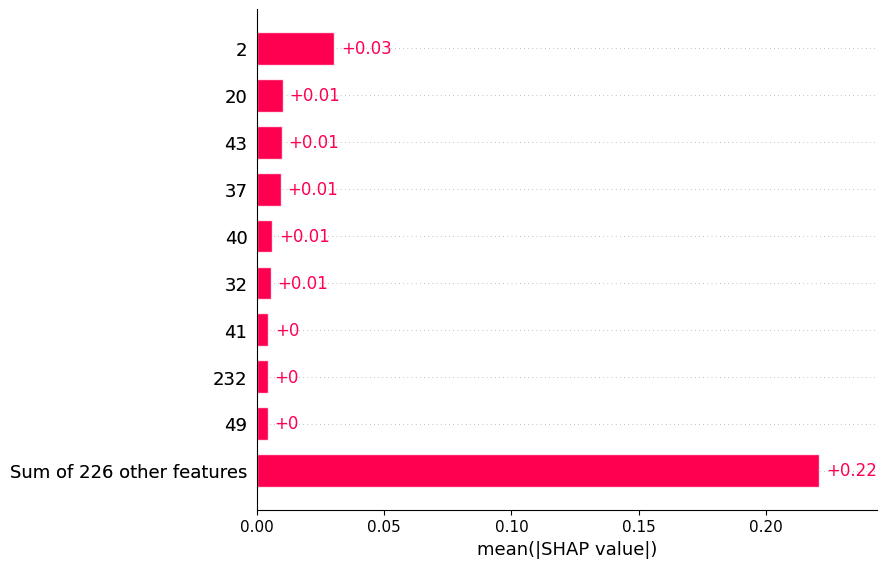

In [ ]:
# Assuming X_train_scaled is a pandas DataFrame or a NumPy array
# Convert to pandas DataFrame if it is a NumPy array
import pandas as pd

if not isinstance(X_train_scaled, pd.DataFrame):
    X_train_scaled = pd.DataFrame(X_train_scaled)

# Ensure all feature names are strings
X_train_scaled.columns = X_train_scaled.columns.astype(str)

# Create an Explanation object for the first output class
# We are assuming you want a global feature importance plot
# So we are using all observations and the first output class
shap_values_explanation = shap.Explanation(
    values=shap_values[:, :,0],  # SHAP values for all observations and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_train_scaled,  # Feature values for all observations
    feature_names=X_train_scaled.columns  # Feature names
)

# Plot the bar plot using the Explanation object
shap.plots.bar(shap_values_explanation)

For class 1

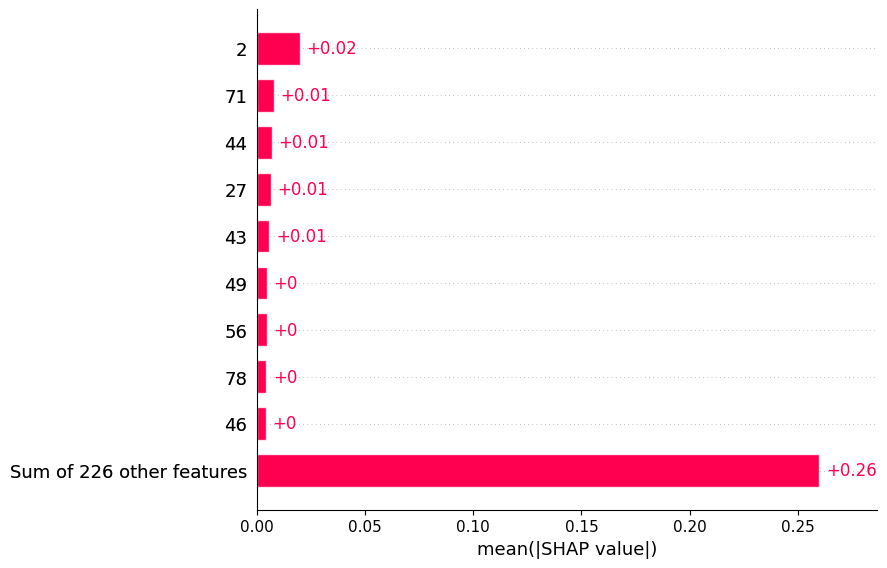

In [ ]:
# Assuming X_train_scaled is a pandas DataFrame or a NumPy array
# Convert to pandas DataFrame if it is a NumPy array
import pandas as pd

if not isinstance(X_train_scaled, pd.DataFrame):
    X_train_scaled = pd.DataFrame(X_train_scaled)

# Ensure all feature names are strings
X_train_scaled.columns = X_train_scaled.columns.astype(str)

# Create an Explanation object for the first output class
# We are assuming you want a global feature importance plot
# So we are using all observations and the first output class
shap_values_explanation = shap.Explanation(
    values=shap_values[:, :,1],  # SHAP values for all observations and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_train_scaled,  # Feature values for all observations
    feature_names=X_train_scaled.columns  # Feature names
)

# Plot the bar plot using the Explanation object
shap.plots.bar(shap_values_explanation)

For class 2

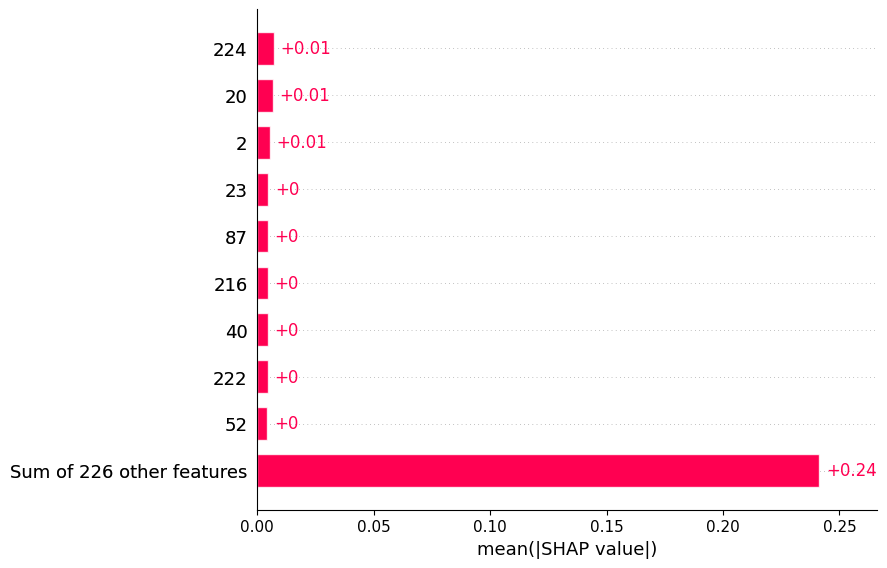

In [ ]:
# Assuming X_train_scaled is a pandas DataFrame or a NumPy array
# Convert to pandas DataFrame if it is a NumPy array
import pandas as pd

if not isinstance(X_train_scaled, pd.DataFrame):
    X_train_scaled = pd.DataFrame(X_train_scaled)

# Ensure all feature names are strings
X_train_scaled.columns = X_train_scaled.columns.astype(str)

# Create an Explanation object for the first output class
# We are assuming you want a global feature importance plot
# So we are using all observations and the first output class
shap_values_explanation = shap.Explanation(
    values=shap_values[:, :,2],  # SHAP values for all observations and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_train_scaled,  # Feature values for all observations
    feature_names=X_train_scaled.columns  # Feature names
)

# Plot the bar plot using the Explanation object
shap.plots.bar(shap_values_explanation)

FOR CLASS 3

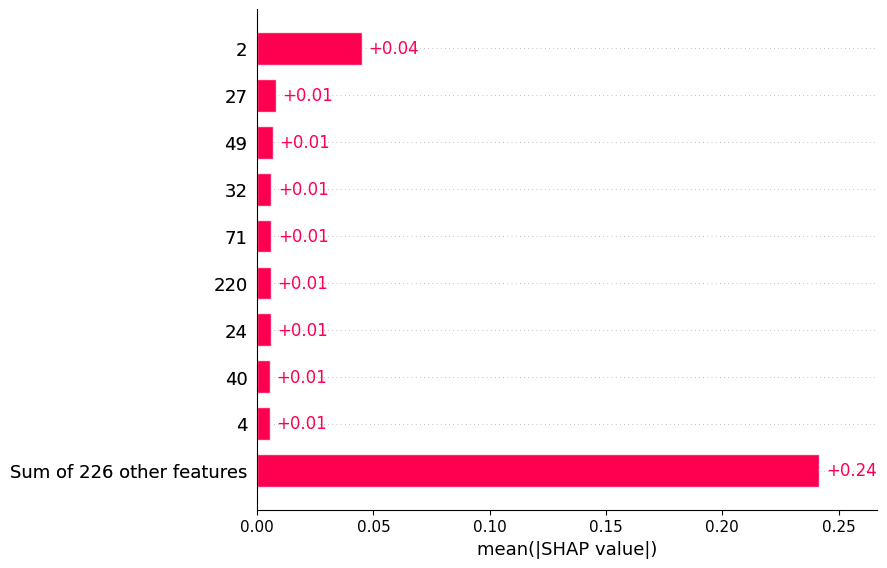

In [ ]:
# Assuming X_train_scaled is a pandas DataFrame or a NumPy array
# Convert to pandas DataFrame if it is a NumPy array
import pandas as pd

if not isinstance(X_train_scaled, pd.DataFrame):
    X_train_scaled = pd.DataFrame(X_train_scaled)

# Ensure all feature names are strings
X_train_scaled.columns = X_train_scaled.columns.astype(str)

# Create an Explanation object for the first output class
# We are assuming you want a global feature importance plot
# So we are using all observations and the first output class
shap_values_explanation = shap.Explanation(
    values=shap_values[:, :,3],  # SHAP values for all observations and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_train_scaled,  # Feature values for all observations
    feature_names=X_train_scaled.columns  # Feature names
)

# Plot the bar plot using the Explanation object
shap.plots.bar(shap_values_explanation)

In [ ]:
Y_train.shape

(7389, 1)

In [ ]:
shap_values

array([[[-1.99362241e-03,  5.29450670e-04, -1.36913164e-03,
          2.83330338e-03],
        [-2.91907313e-03, -1.12058770e-03,  8.19976186e-04,
          3.21968464e-03],
        [-3.01083553e-02, -2.07183333e-02,  6.28747287e-03,
          4.45392157e-02],
        ...,
        [ 4.58059501e-03, -2.08635610e-03, -1.49629799e-03,
         -9.97940914e-04],
        [ 5.13412221e-04,  2.20451471e-04,  1.18136682e-04,
         -8.52000374e-04],
        [-9.79532280e-05,  6.27787485e-04,  8.72151967e-04,
         -1.40198622e-03]],

       [[-1.69324776e-03,  1.57815114e-04, -1.31195630e-03,
          2.84738895e-03],
        [-3.29787614e-03, -3.07953450e-04,  1.02506890e-03,
          2.58076069e-03],
        [ 1.44899929e-02,  3.19612764e-03, -1.89870773e-03,
         -1.57874129e-02],
        ...,
        [ 4.59692945e-03, -1.58714941e-03, -1.87023931e-03,
         -1.13954073e-03],
        [-3.08570244e-04,  8.68317336e-04, -9.73172819e-05,
         -4.62429811e-04],
        [-1.134

In [ ]:
shap.initjs()
# Assuming you want to plot the force plot for the 5th observation
# Replace 4 with the actual column names if needed
shap.force_plot(expected_value_4_classes[3], shap_values[4,:,3], X_train_scaled.iloc[4])

In [ ]:
shap_values.shape

(100, 235, 4)

In [ ]:
print(np.unique(Y_test))

[0. 1. 2. 3.]


In [ ]:
shap.initjs()
shap.force_plot(expected_value[3], shap_values[:,:,3])

In [ ]:
shap_values.shape

(100, 235, 4)

In [ ]:
#X_train = X_train.squeeze(1)

In [ ]:
#feature_names = ['Latitude',	'Longitude',	'Field size (ha)',	'ndvi',	'min_vh',	'min_vv',	'max_vh',	'max_vv'	,'range_vh'	,'range_vv',	'mean_vh',	'mean_vv',	'std_vh',	'std_vv',	'ratio_vv_vh',	'rvi']


In [ ]:
data_X

,Field size (ha),ndvi,min_vh,min_vv,max_vh,max_vv,range_vh,range_vv,mean_vh,mean_vv,...,Sunlight duration section 14,District_Chau_Phu,District_Chau_Thanh,District_Thoai_Son,Season_SA,Season_WS,"Season(SA = Summer Autumn, WS = Winter Spring)_SA","Season(SA = Summer Autumn, WS = Winter Spring)_WS","Rice Crop Intensity(D=Double, T=Triple)_D","Rice Crop Intensity(D=Double, T=Triple)_T"
0,3.40,0.078939,0.024129,0.005246,0.357296,0.059441,0.333167,0.054196,0.132912,0.026118,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
1,2.43,0.012374,0.053835,0.016737,0.448553,0.136669,0.394718,0.119932,0.179150,0.051274,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
2,1.95,0.186522,0.016936,0.010781,0.424133,0.114186,0.407197,0.103404,0.116764,0.030350,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
3,4.30,0.106439,0.027307,0.003393,0.335494,0.070942,0.308188,0.067549,0.111655,0.026225,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
4,3.30,0.417298,0.021431,0.004080,0.226502,0.089368,0.205071,0.085289,0.114040,0.028807,...,23.000000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552,7.80,0.204224,0.007758,0.002246,0.447422,0.092458,0.439664,0.090212,0.126006,0.031105,...,36384.611795,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
553,2.00,0.145287,0.023660,0.003157,0.255528,0.080506,0.231868,0.077349,0.095423,0.025837,...,43933.596078,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
554,6.20,0.138216,0.008751,0.002891,0.387613,0.155461,0.378862,0.152571,0.146239,0.037837,...,43685.172222,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
555,3.00,0.097349,0.019068,0.001930,0.488400,0.097946,0.469332,0.096017,0.139716,0.029845,...,43710.367680,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0


In [ ]:
#bins = [5200, 5850, 6500, 7150, 8000]
#labels = ['0', '1', '2','3']

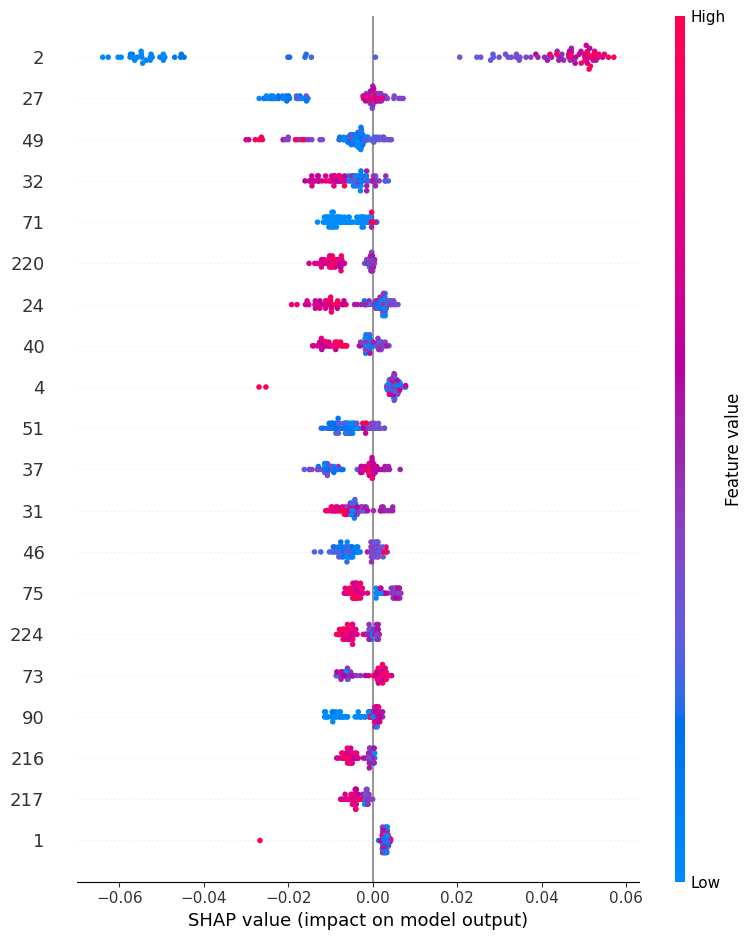

In [ ]:
shap_values_class_3 = shap_values[:, :, 3]

shap.summary_plot(shap_values_class_3, X_train_scaled[:100], plot_type="dot")


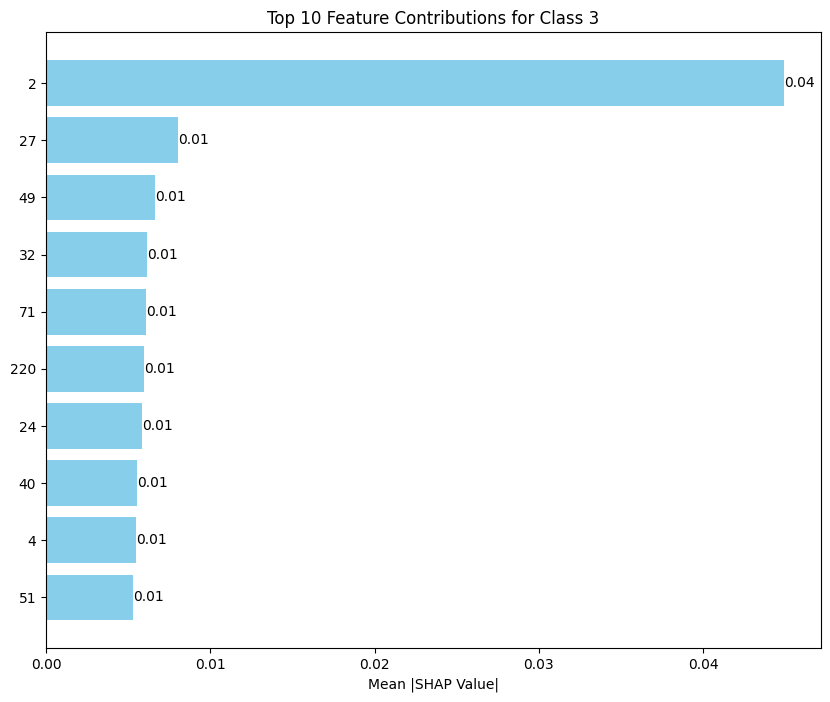

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import shap

# Compute mean absolute SHAP values for each feature
mean_shap_values = np.abs(shap_values_class_3).mean(axis=0)

# Sort features by importance
sorted_indices = np.argsort(mean_shap_values)[::-1]
sorted_features = X_train_scaled.columns[sorted_indices]  # Adjust if using a DataFrame
sorted_shap_values = mean_shap_values[sorted_indices]

# Create a bar plot with contribution values
plt.figure(figsize=(10, 8))
bars = plt.barh(sorted_features[:10], sorted_shap_values[:10], color='skyblue')
plt.xlabel('Mean |SHAP Value|')
plt.title('Top 10 Feature Contributions for Class 3')

# Add contribution values to the bars
for bar, value in zip(bars, sorted_shap_values[:10]):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{value:.2f}',
             va='center', ha='left', fontsize=10)

plt.gca().invert_yaxis()  # Highest values on top
plt.show()


In [ ]:
#shap_values_class_3 = shap_values[:, :, 3]

#shap.summary_plot(shap_values_class_3, X_train_scaled[:100], plot_type="bar")


In [ ]:
X_train_scaled.shape

(7389, 235)

In [ ]:
Y.shape

(10557, 1)

**APPLYING XAI IN TEST DATASET**

In [ ]:
X_test_scaled.shape

(3168, 235)

In [ ]:
#Explaining the model by shapley values
!pip install shap # Install the shap package
import shap # Now you should be able to import shap

explainer = shap.TreeExplainer(rf_model)
shap_values = explainer.shap_values(X_test_scaled[:100])

# Check if expected_value exists and handle accordingly
if hasattr(explainer, 'expected_value'):
    expected_value = explainer.expected_value
else:
    expected_value = np.mean(ensemble_preds.predict(X_test_scaled)) # Calculate average prediction as a substitute

#shap_values = shap_values.squeeze(1)

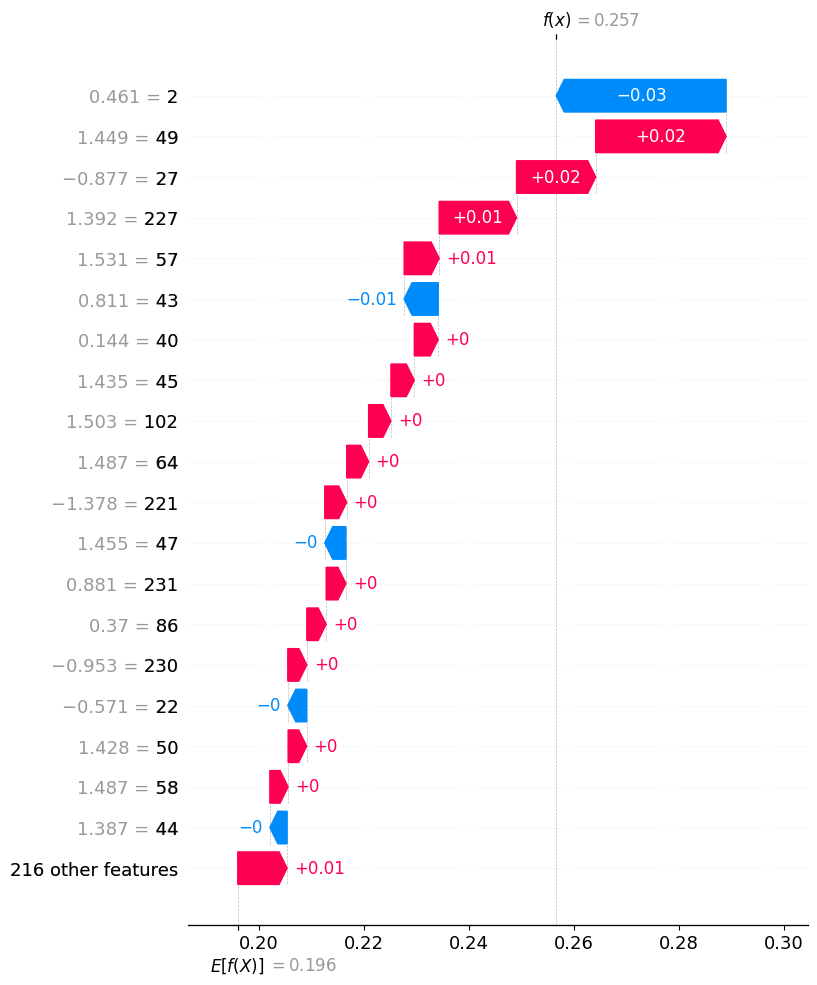

In [ ]:
#waterfall plot for the second observation and the first output class
import shap #import the shap library

# Assuming X_test_scaled is a pandas DataFrame or a NumPy array
# Convert to pandas DataFrame if it is a NumPy array
import pandas as pd
if not isinstance(X_test_scaled, pd.DataFrame):
    X_test_scaled = pd.DataFrame(X_test_scaled)

# Ensure all feature names are strings
X_test_scaled.columns = X_test_scaled.columns.astype(str)

# Assuming rf_model is your tested model
# Create an Explanation object for the second observation (index 1) and the first output class (index 0)
shap_values_explanation = shap.Explanation(
    values=shap_values[1, :, 0],  # SHAP values for the second observation and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_test_scaled.iloc[1],  # Feature values for the second observation
    feature_names=X_test_scaled.columns  # Feature names
)

# Plot the waterfall plot
shap.plots.waterfall(shap_values_explanation, max_display=20) # Pass the Explanation object and max_display


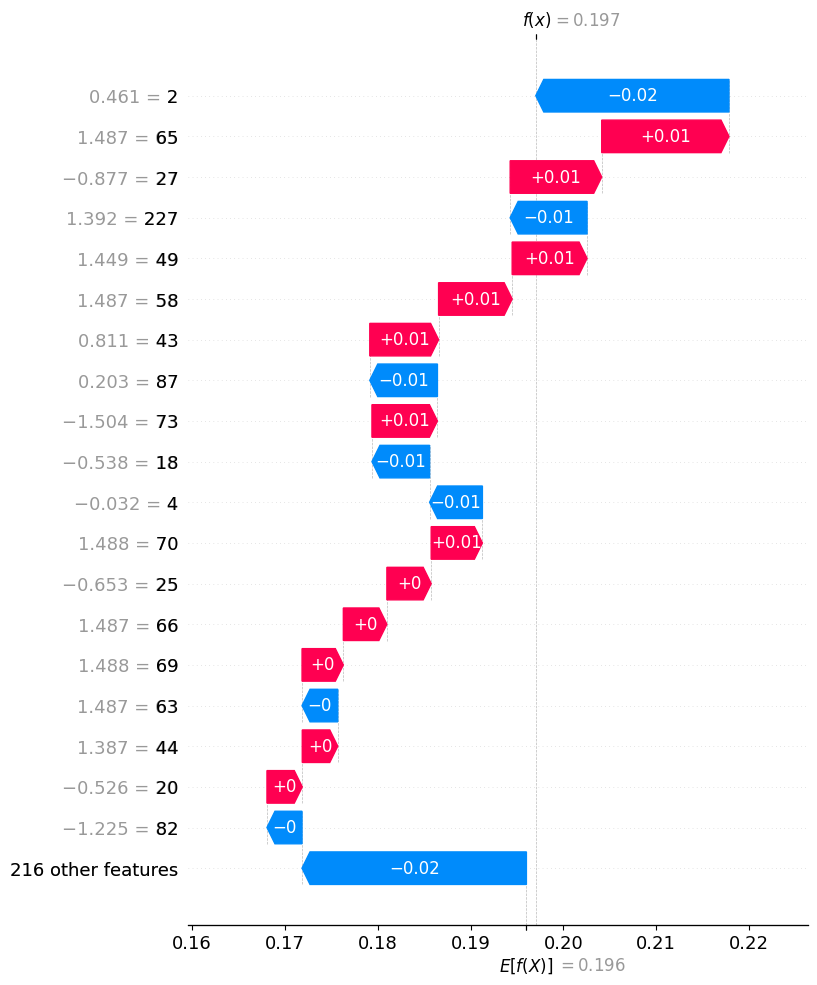

In [ ]:
#waterfall plot for the second observation and the 2nd output class
import shap #import the shap library

# Assuming X_test_scaled is a pandas DataFrame or a NumPy array
# Convert to pandas DataFrame if it is a NumPy array
import pandas as pd
if not isinstance(X_test_scaled, pd.DataFrame):
    X_test_scaled = pd.DataFrame(X_test_scaled)

# Ensure all feature names are strings
X_test_scaled.columns = X_test_scaled.columns.astype(str)

# Assuming rf_model is your tested model
# Create an Explanation object for the second observation (index 1) and the first output class (index 0)
shap_values_explanation = shap.Explanation(
    values=shap_values[1, :, 1],  # SHAP values for the second observation and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_test_scaled.iloc[1],  # Feature values for the second observation
    feature_names=X_test_scaled.columns  # Feature names
)

# Plot the waterfall plot
shap.plots.waterfall(shap_values_explanation, max_display=20) # Pass the Explanation object and max_display


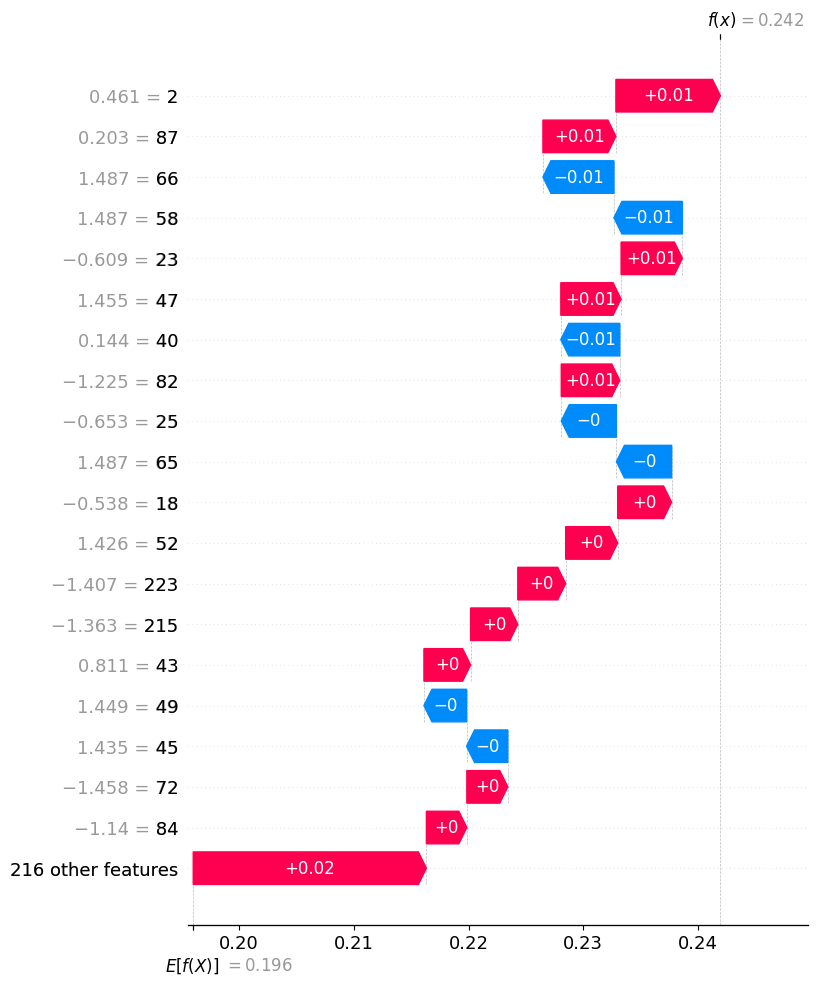

In [ ]:
#waterfall plot for the second observation and the 3rd output class
import shap #import the shap library

# Assuming X_test_scaled is a pandas DataFrame or a NumPy array
# Convert to pandas DataFrame if it is a NumPy array
import pandas as pd
if not isinstance(X_test_scaled, pd.DataFrame):
    X_test_scaled = pd.DataFrame(X_test_scaled)

# Ensure all feature names are strings
X_test_scaled.columns = X_test_scaled.columns.astype(str)

# Assuming rf_model is your tested model
# Create an Explanation object for the second observation (index 1) and the first output class (index 0)
shap_values_explanation = shap.Explanation(
    values=shap_values[1, :, 2],  # SHAP values for the second observation and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_test_scaled.iloc[1],  # Feature values for the second observation
    feature_names=X_test_scaled.columns  # Feature names
)

# Plot the waterfall plot
shap.plots.waterfall(shap_values_explanation, max_display=20) # Pass the Explanation object and max_display


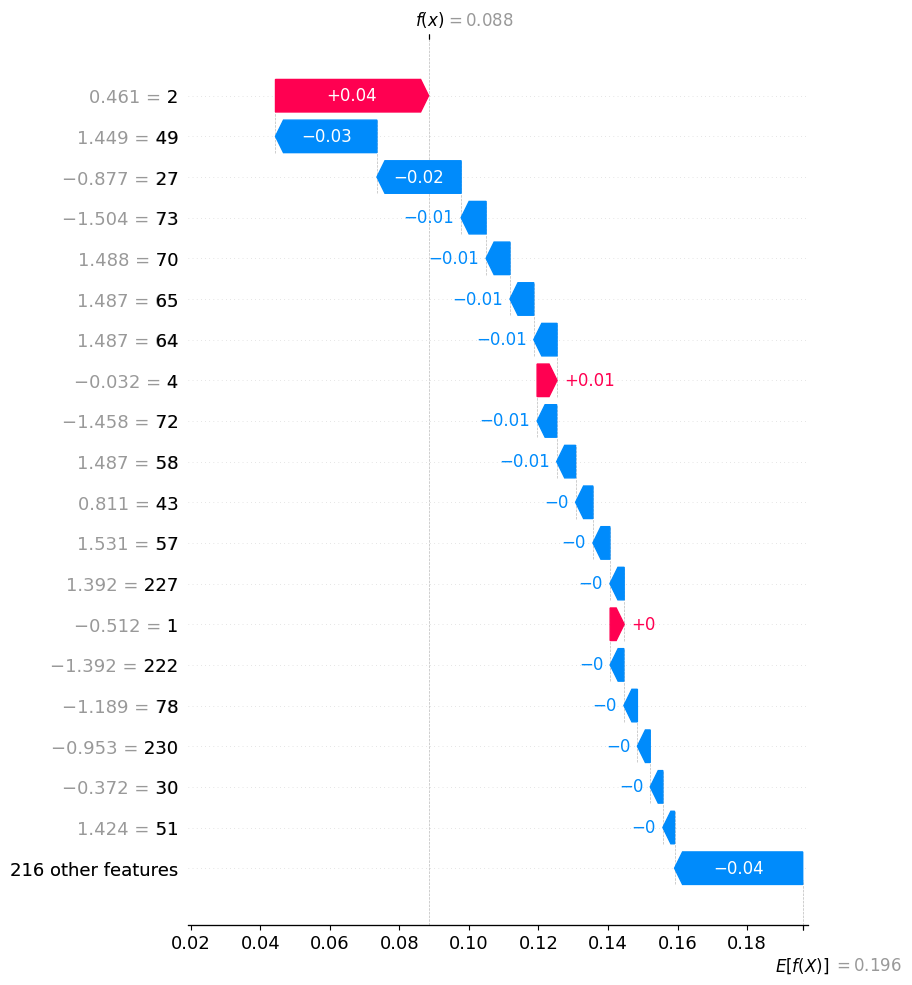

In [ ]:
#waterfall plot for the second observation and the 4th output class
import shap #import the shap library

# Assuming X_test_scaled is a pandas DataFrame or a NumPy array
# Convert to pandas DataFrame if it is a NumPy array
import pandas as pd
if not isinstance(X_test_scaled, pd.DataFrame):
    X_test_scaled = pd.DataFrame(X_test_scaled)

# Ensure all feature names are strings
X_test_scaled.columns = X_test_scaled.columns.astype(str)

# Assuming rf_model is your tested model
# Create an Explanation object for the second observation (index 1) and the first output class (index 0)
shap_values_explanation = shap.Explanation(
    values=shap_values[1, :, 3],  # SHAP values for the second observation and the 4th output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_test_scaled.iloc[1],  # Feature values for the second observation
    feature_names=X_test_scaled.columns  # Feature names
)

# Plot the waterfall plot
shap.plots.waterfall(shap_values_explanation, max_display=20) # Pass the Explanation object and max_display


In [ ]:
shap.initjs()
# Assuming you want to plot for the first output class
shap.plots.force(explainer.expected_value[0], shap_values[0, :, 0])  # Pass expected_value and shap_values


In [ ]:
shap.initjs()
# Assuming you want to plot for the 2nd output class
shap.plots.force(explainer.expected_value[0], shap_values[0, :, 1])  # Pass expected_value and shap_values



In [ ]:
shap.initjs()
# Assuming you want to plot for the 3rd output class
shap.plots.force(explainer.expected_value[0], shap_values[0, :, 2])  # Pass expected_value and shap_values


In [ ]:
shap.initjs()
# Assuming you want to plot for the 4th output class
shap.plots.force(explainer.expected_value[0], shap_values[0, :, 3])  # Pass expected_value and shap_values


In [ ]:
shap.initjs()
shap.force_plot(expected_value[3], shap_values[:,:,3])

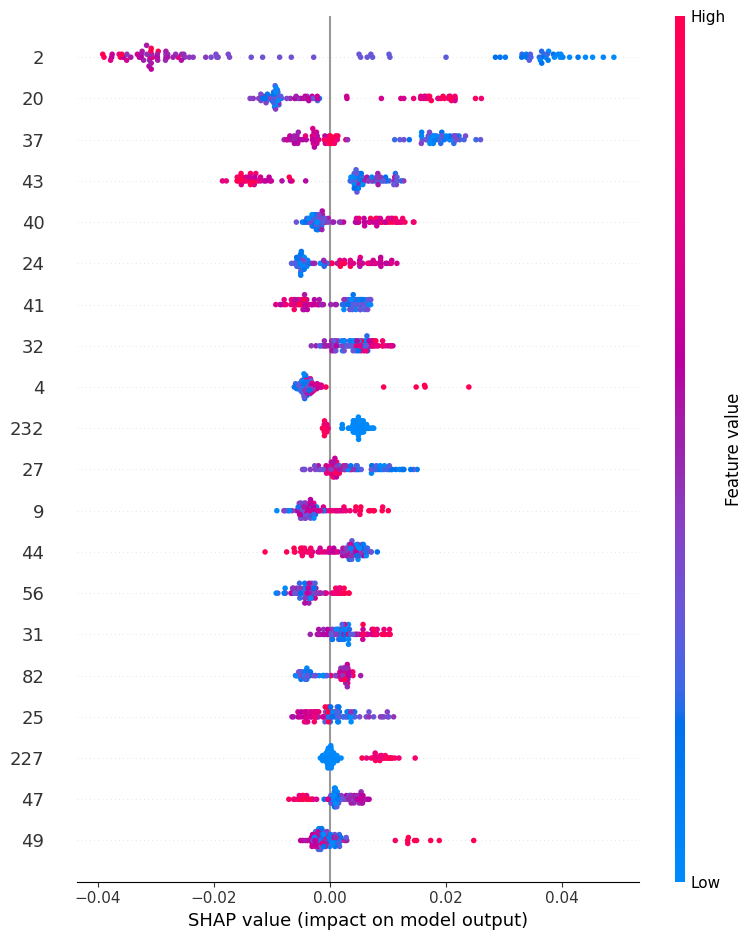

In [ ]:
shap_values_class_0 = shap_values[:, :, 0]

shap.summary_plot(shap_values_class_0, X_test_scaled[:100], plot_type="dot")

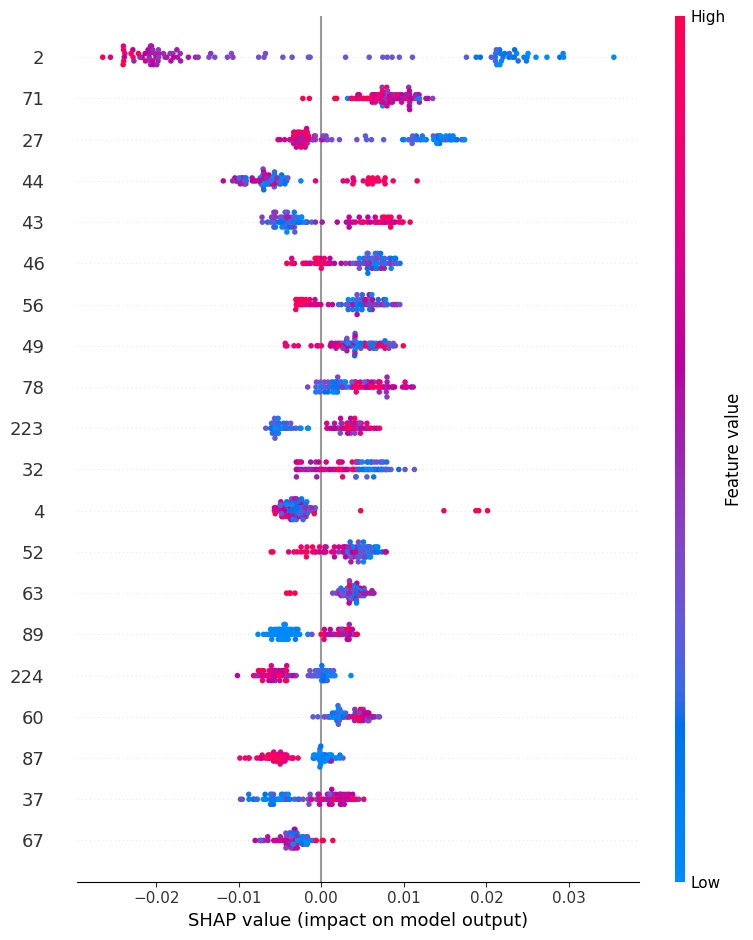

In [ ]:
shap_values_class_1 = shap_values[:, :, 1]

shap.summary_plot(shap_values_class_1, X_test_scaled[:100], plot_type="dot")

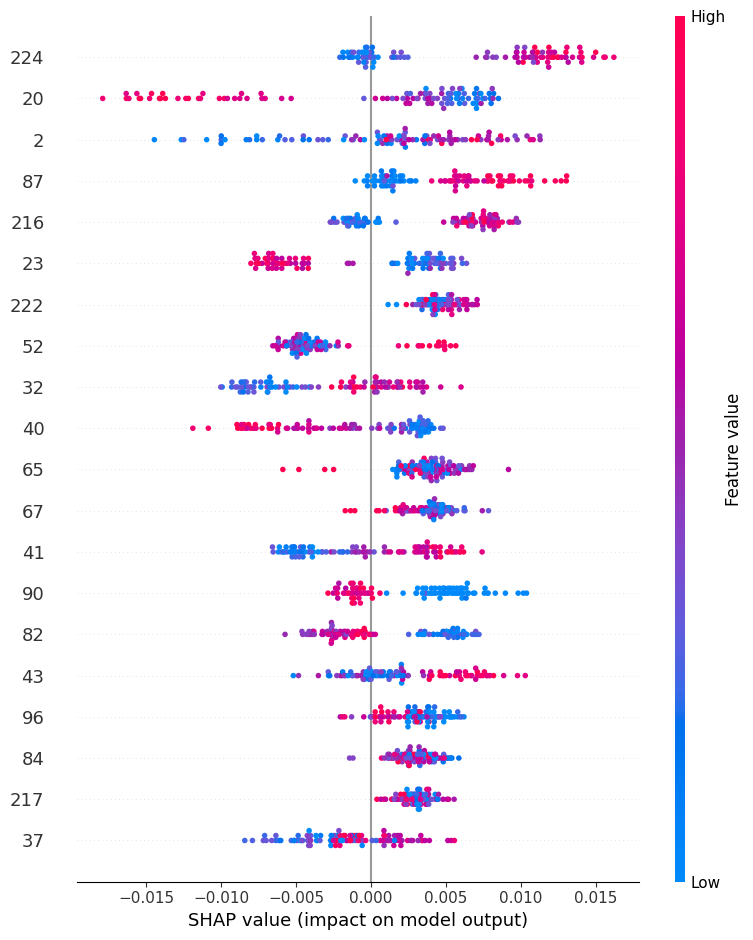

In [ ]:
shap_values_class_2 = shap_values[:, :, 2]

shap.summary_plot(shap_values_class_2, X_test_scaled[:100], plot_type="dot")

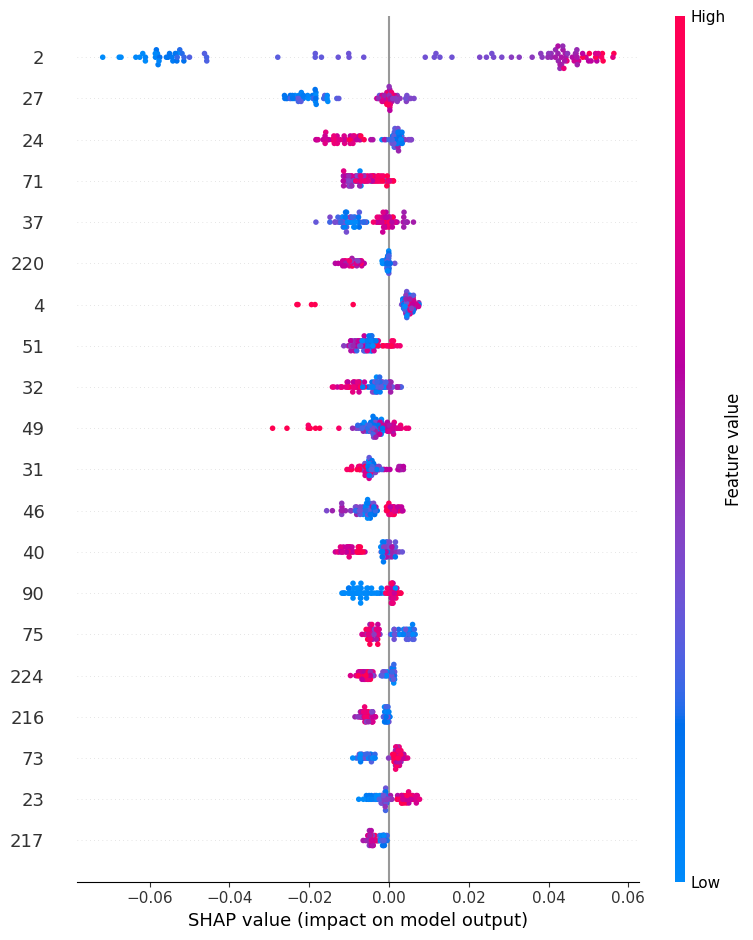

In [ ]:
shap_values_class_3 = shap_values[:, :, 3]

shap.summary_plot(shap_values_class_3, X_test_scaled[:100], plot_type="dot")

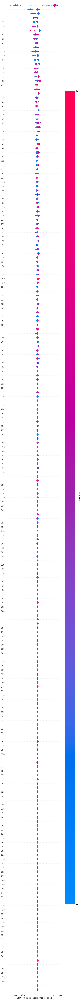

In [ ]:
shap_values_class_3 = shap_values[:, :, 3]

# Set max_display to show all features (e.g., 235)
shap.summary_plot(shap_values_class_3, X_test_scaled[:100], plot_type="dot", max_display=235)

In [ ]:
import numpy as np
import pandas as pd

# Compute mean SHAP values for each feature
mean_shap_values = shap_values_class_3.mean(axis=0)

# Identify features with negative mean SHAP values
negative_features = np.where(mean_shap_values < 0)[0]

# Extract feature names with negative impacts
negative_feature_names = X_test_scaled.columns[negative_features]

# Output features with negative impact
print("Features with Negative Impact:")
print(negative_feature_names)


Features with Negative Impact:
Index(['3', '6', '12', '13', '14', '17', '19', '22', '24', '25',
       ...
       '225', '226', '227', '228', '229', '230', '231', '232', '233', '234'],
      dtype='object', length=188)


In [ ]:
negative_feature_names

Index(['3', '6', '12', '13', '14', '17', '19', '22', '24', '25',
       ...
       '225', '226', '227', '228', '229', '230', '231', '232', '233', '234'],
      dtype='object', length=188)

In [ ]:
# Convert the Index object to a DataFrame
negative_feature_names_df = pd.DataFrame(negative_feature_names, columns=['Feature Names'])

# Save the DataFrame to a CSV file
negative_feature_names_df.to_csv("negative_features.csv", index=False)

In [ ]:
import pandas as pd
import numpy as np

# Calculate mean SHAP values for each feature
mean_shap_values = shap_values_class_3.mean(axis=0)

# Identify features with negative mean SHAP values
negative_features = np.where(mean_shap_values < 0)[0]

# Extract feature names and their mean SHAP values
negative_feature_names = X_test_scaled.columns[negative_features]
negative_feature_importance = mean_shap_values[negative_features]

# Create a DataFrame with feature names and their importance
negative_features_df = pd.DataFrame({
    'Feature Name': negative_feature_names,
    'Mean SHAP Value': negative_feature_importance
})

# Sort the DataFrame by absolute SHAP values for better readability
negative_features_df = negative_features_df.sort_values(by='Mean SHAP Value', ascending=True)

# Save the DataFrame to a CSV file (optional)
negative_features_df.to_csv("negative_features_with_importance.csv", index=False)

# Display the DataFrame
print(negative_features_df)


    Feature Name  Mean SHAP Value
11            27    -8.238639e-03
48            71    -6.252844e-03
173          220    -5.730580e-03
32            51    -5.267652e-03
19            37    -5.058524e-03
..           ...              ...
136          177    -2.261826e-05
161          208    -2.122460e-05
118          155    -1.727473e-05
113          150    -9.996247e-06
25            44    -3.404087e-07

[188 rows x 2 columns]


In [ ]:
import pandas as pd

# List of feature indices provided
feature_indices = [
    51, 40, 32, 31, 24, 227, 41, 59, 78, 46, 58, 65, 232, 49, 64, 30, 85, 228,
    60, 63, 38, 231, 29, 220, 230, 97, 45, 71, 222, 90, 27, 229, 226, 108, 75,
    37, 77, 76, 217, 223, 94, 218, 224, 86, 111, 192, 48, 73, 43, 84, 124, 42,
    216, 79, 234, 88, 101, 185, 23, 169, 52, 109, 175, 89, 219, 113, 107, 22,
    35, 114, 116, 123, 82, 156, 3, 233, 182, 195, 165, 56, 87, 66, 20, 136, 210,
    132, 139, 93, 189, 160, 200, 144, 106, 134, 120, 163, 146, 215, 168, 158,
    209, 133, 203, 143, 110, 121, 206, 157, 112, 177, 173, 193, 135, 171, 199,
    62, 130, 53, 119, 179, 122, 191, 67, 176, 204, 225, 166, 188, 172, 161, 214,
    170, 10, 33, 36, 207, 180, 50, 125, 140, 198, 153, 138, 126, 147, 174, 129,
    154, 55, 162, 57, 127, 167, 221, 26, 187, 178, 197, 61, 6, 181, 54, 145, 186,
    212, 183, 205, 21, 164, 208, 213, 13, 80, 115, 201, 102, 118, 25, 131, 137
]


# Get feature names corresponding to the indices
feature_names = [data_X.columns[index] for index in feature_indices]

# Create a DataFrame to store the indices and names
feature_info = pd.DataFrame({
    'Feature Index': feature_indices,
    'Feature Name': feature_names
})

# Save to a CSV file (optional)
feature_info.to_csv("selected_feature_names.csv", index=False)

# Display the DataFrame
print(feature_info)


     Feature Index           Feature Name
0               51         temp section 8
1               40     tempmin section 11
2               32      tempmin section 3
3               31      tempmin section 2
4               24      tempmax section 9
..             ...                    ...
175            102  precipcover section 3
176            118     windgust section 5
177             25     tempmax section 10
178            131    windspeed section 4
179            137   windspeed section 10

[180 rows x 2 columns]


class_0

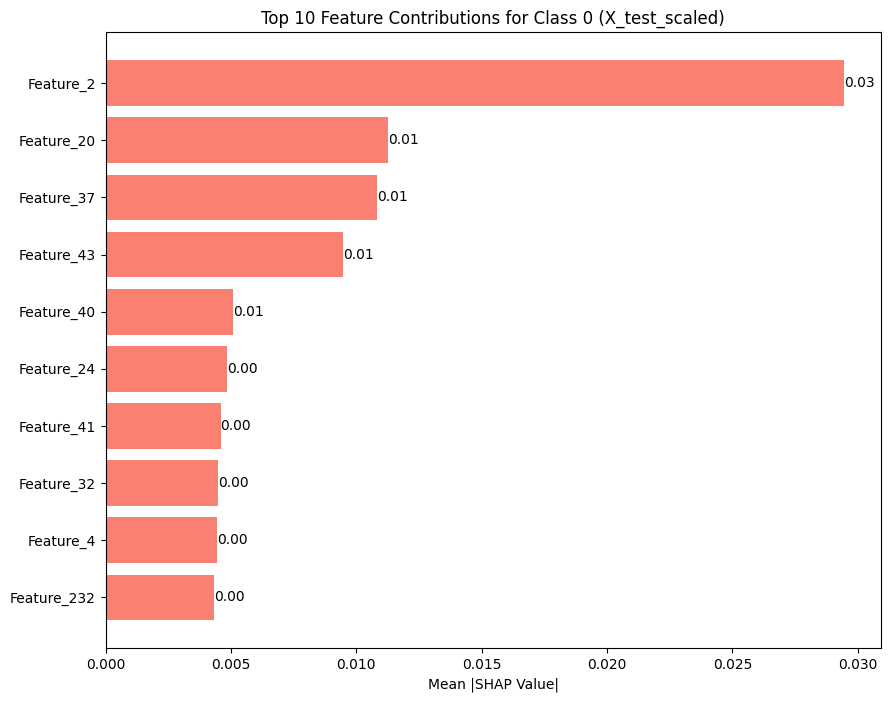

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import shap

# Compute mean absolute SHAP values for each feature
mean_shap_values = np.abs(shap_values_class_0[:100]).mean(axis=0)

# Sort features by importance
sorted_indices = np.argsort(mean_shap_values)[::-1]

# If original_df is not available, create feature names based on the number of features
sorted_features = [f'Feature_{i}' for i in sorted_indices]  # Generate feature names

sorted_shap_values = mean_shap_values[sorted_indices]

# Create a bar plot with contribution values
plt.figure(figsize=(10, 8))
bars = plt.barh(sorted_features[:10], sorted_shap_values[:10], color='salmon')
plt.xlabel('Mean |SHAP Value|')
plt.title('Top 10 Feature Contributions for Class 0 (X_test_scaled)')

# Add contribution values to the bars
for bar, value in zip(bars, sorted_shap_values[:10]):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{value:.2f}',
             va='center', ha='left', fontsize=10)

plt.gca().invert_yaxis()  # Highest values on top
plt.show()

class_1

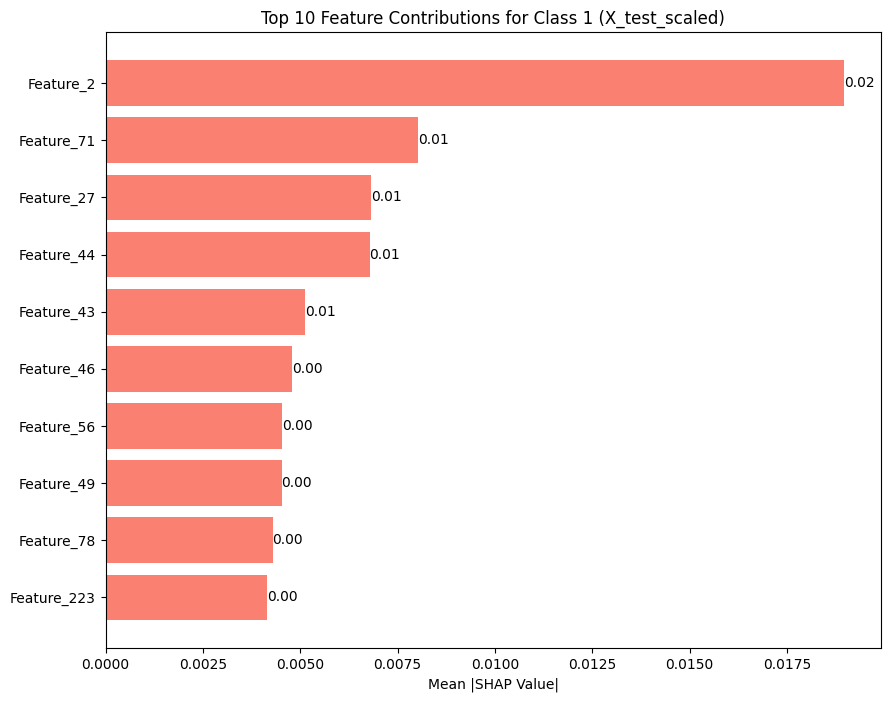

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import shap

# Compute mean absolute SHAP values for each feature
mean_shap_values = np.abs(shap_values_class_1[:100]).mean(axis=0)

# Sort features by importance
sorted_indices = np.argsort(mean_shap_values)[::-1]

# If original_df is not available, create feature names based on the number of features
sorted_features = [f'Feature_{i}' for i in sorted_indices]  # Generate feature names

sorted_shap_values = mean_shap_values[sorted_indices]

# Create a bar plot with contribution values
plt.figure(figsize=(10, 8))
bars = plt.barh(sorted_features[:10], sorted_shap_values[:10], color='salmon')
plt.xlabel('Mean |SHAP Value|')
plt.title('Top 10 Feature Contributions for Class 1 (X_test_scaled)')

# Add contribution values to the bars
for bar, value in zip(bars, sorted_shap_values[:10]):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{value:.2f}',
             va='center', ha='left', fontsize=10)

plt.gca().invert_yaxis()  # Highest values on top
plt.show()

class_2

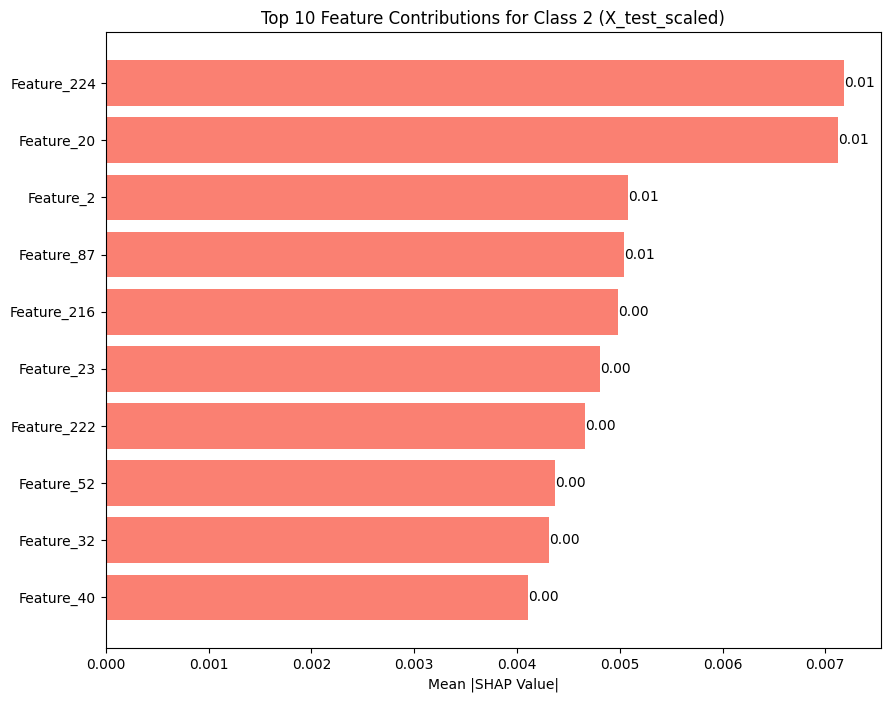

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import shap

# Compute mean absolute SHAP values for each feature
mean_shap_values = np.abs(shap_values_class_2[:100]).mean(axis=0)

# Sort features by importance
sorted_indices = np.argsort(mean_shap_values)[::-1]

# If original_df is not available, create feature names based on the number of features
sorted_features = [f'Feature_{i}' for i in sorted_indices]  # Generate feature names

sorted_shap_values = mean_shap_values[sorted_indices]

# Create a bar plot with contribution values
plt.figure(figsize=(10, 8))
bars = plt.barh(sorted_features[:10], sorted_shap_values[:10], color='salmon')
plt.xlabel('Mean |SHAP Value|')
plt.title('Top 10 Feature Contributions for Class 2 (X_test_scaled)')

# Add contribution values to the bars
for bar, value in zip(bars, sorted_shap_values[:10]):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{value:.2f}',
             va='center', ha='left', fontsize=10)

plt.gca().invert_yaxis()  # Highest values on top
plt.show()

class_3

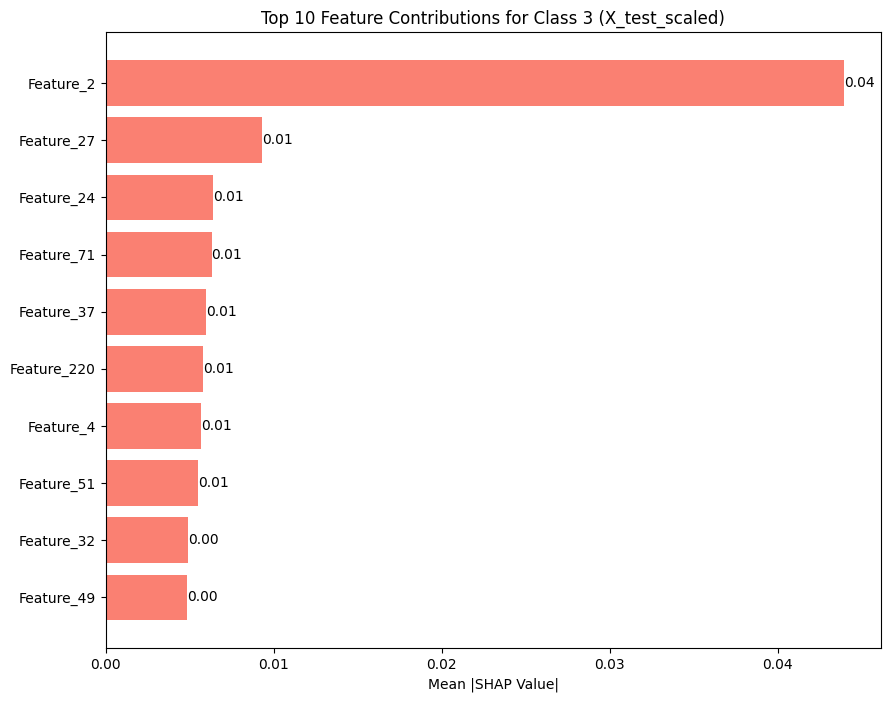

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import shap

# Compute mean absolute SHAP values for each feature
mean_shap_values = np.abs(shap_values_class_3[:100]).mean(axis=0)

# Sort features by importance
sorted_indices = np.argsort(mean_shap_values)[::-1]

# If original_df is not available, create feature names based on the number of features
sorted_features = [f'Feature_{i}' for i in sorted_indices]  # Generate feature names

sorted_shap_values = mean_shap_values[sorted_indices]

# Create a bar plot with contribution values
plt.figure(figsize=(10, 8))
bars = plt.barh(sorted_features[:10], sorted_shap_values[:10], color='salmon')
plt.xlabel('Mean |SHAP Value|')
plt.title('Top 10 Feature Contributions for Class 3 (X_test_scaled)')

# Add contribution values to the bars
for bar, value in zip(bars, sorted_shap_values[:10]):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{value:.2f}',
             va='center', ha='left', fontsize=10)

plt.gca().invert_yaxis()  # Highest values on top
plt.show()

In [ ]:
shap_values.shape

(100, 235, 4)

Absolute Mean Map For class 0

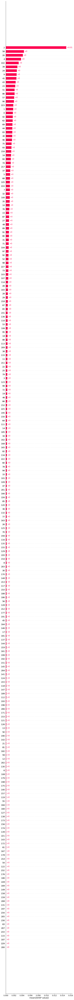

In [ ]:
import pandas as pd

if not isinstance(X_test_scaled, pd.DataFrame):
    X_test_scaled = pd.DataFrame(X_test_scaled)

# Ensure all feature names are strings
X_test_scaled.columns = X_test_scaled.columns.astype(str)

# Create an Explanation object for the first output class
shap_values_explanation = shap.Explanation(
    values=shap_values[:, :, 0],  # SHAP values for all observations and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_test_scaled,  # Feature values for all observations
    feature_names=X_test_scaled.columns  # Feature names
)

# Plot the bar plot using the Explanation object and display 100 features
shap.plots.bar(shap_values_explanation, max_display=235)

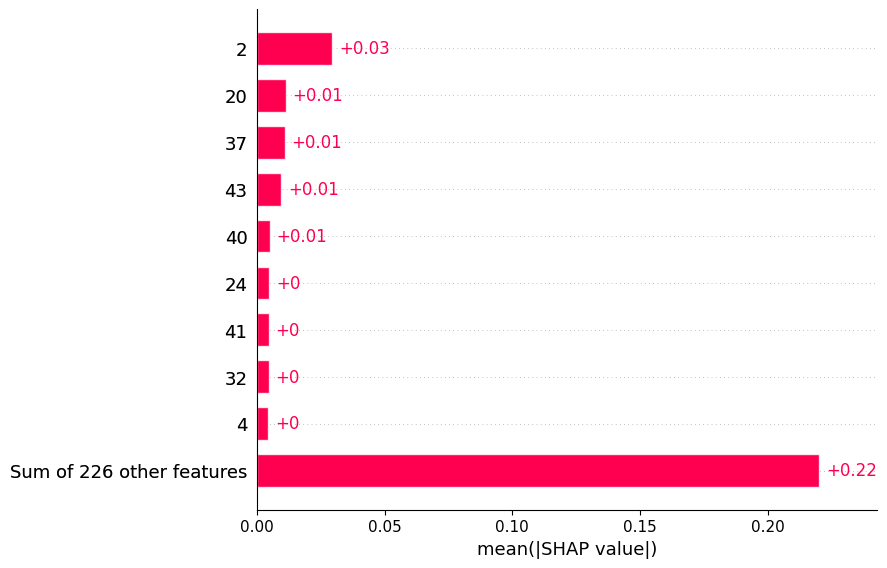

In [ ]:
import pandas as pd

if not isinstance(X_test_scaled, pd.DataFrame):
    X_test_scaled = pd.DataFrame(X_test_scaled)

# Ensure all feature names are strings
X_test_scaled.columns = X_test_scaled.columns.astype(str)

# Create an Explanation object for the first output class
# We are assuming you want a global feature importance plot
# So we are using all observations and the first output class
shap_values_explanation = shap.Explanation(
    values=shap_values[:, :,0],  # SHAP values for all observations and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_test_scaled,  # Feature values for all observations
    feature_names=X_test_scaled.columns  # Feature names
)

# Plot the bar plot using the Explanation object
shap.plots.bar(shap_values_explanation)

Absolute Mean Map For class 1

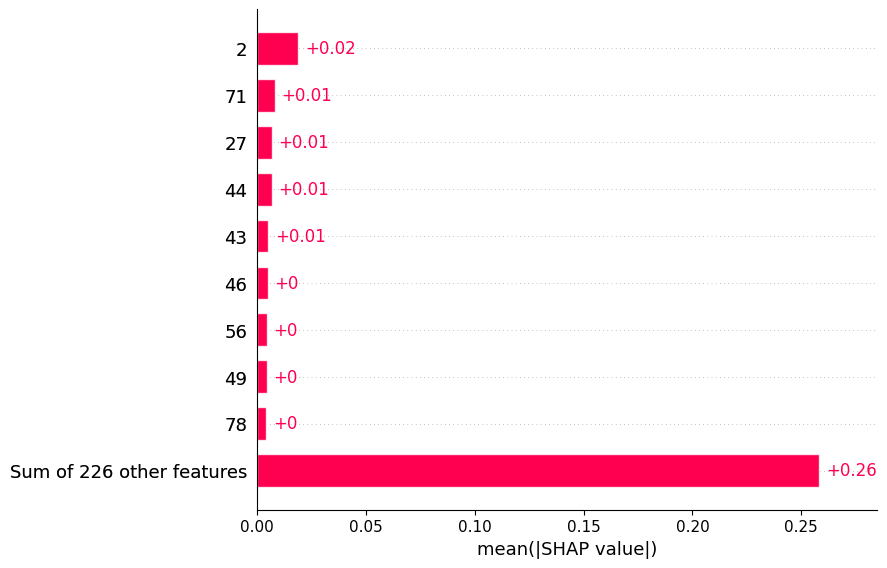

In [ ]:
import pandas as pd

if not isinstance(X_test_scaled, pd.DataFrame):
    X_test_scaled = pd.DataFrame(X_test_scaled)

# Ensure all feature names are strings
X_test_scaled.columns = X_test_scaled.columns.astype(str)

# Create an Explanation object for the first output class
# We are assuming you want a global feature importance plot
# So we are using all observations and the first output class
shap_values_explanation = shap.Explanation(
    values=shap_values[:, :,1],  # SHAP values for all observations and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_test_scaled,  # Feature values for all observations
    feature_names=X_test_scaled.columns  # Feature names
)

# Plot the bar plot using the Explanation object
shap.plots.bar(shap_values_explanation)

Absolute Mean Map For class 2

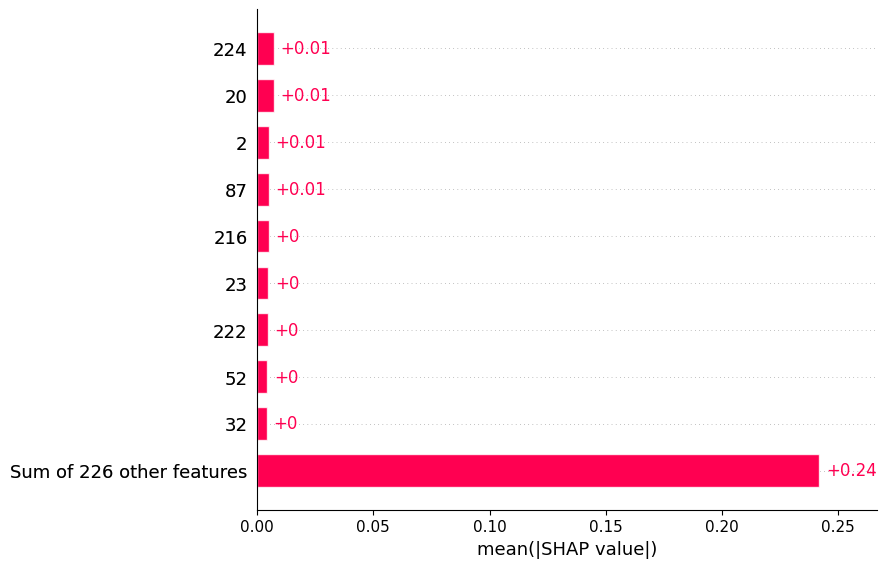

In [ ]:
import pandas as pd

if not isinstance(X_test_scaled, pd.DataFrame):
    X_test_scaled = pd.DataFrame(X_test_scaled)

# Ensure all feature names are strings
X_test_scaled.columns = X_test_scaled.columns.astype(str)

# Create an Explanation object for the first output class
# We are assuming you want a global feature importance plot
# So we are using all observations and the first output class
shap_values_explanation = shap.Explanation(
    values=shap_values[:, :,2],  # SHAP values for all observations and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_test_scaled,  # Feature values for all observations
    feature_names=X_test_scaled.columns  # Feature names
)

# Plot the bar plot using the Explanation object
shap.plots.bar(shap_values_explanation)

Absolute Mean Map For class 3

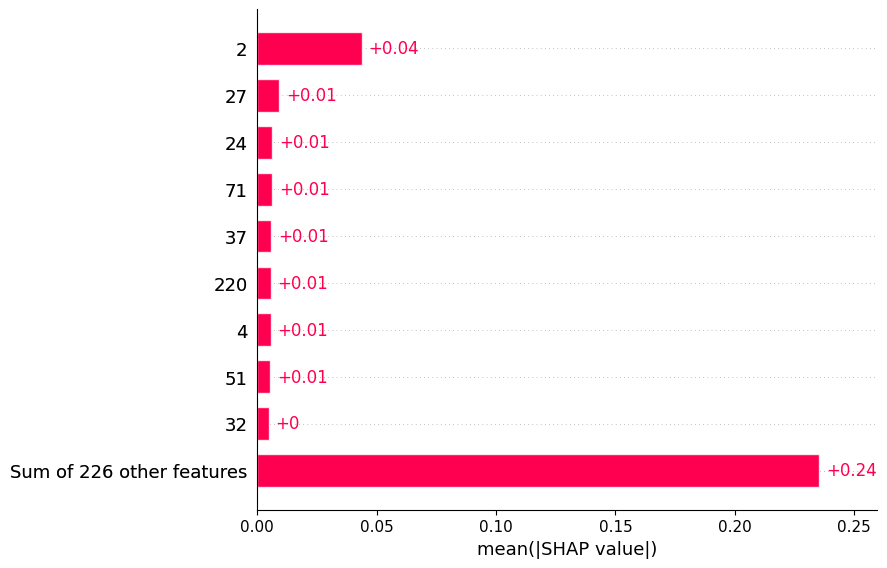

In [ ]:
import pandas as pd

if not isinstance(X_test_scaled, pd.DataFrame):
    X_test_scaled = pd.DataFrame(X_test_scaled)

# Ensure all feature names are strings
X_test_scaled.columns = X_test_scaled.columns.astype(str)

# Create an Explanation object for the first output class
# We are assuming you want a global feature importance plot
# So we are using all observations and the first output class
shap_values_explanation = shap.Explanation(
    values=shap_values[:, :,3],  # SHAP values for all observations and the first output class
    base_values=explainer.expected_value[0] if hasattr(explainer, 'expected_value') else explainer.base_values[0],  # Expected value for the first output class
    data=X_test_scaled,  # Feature values for all observations
    feature_names=X_test_scaled.columns  # Feature names
)

# Plot the bar plot using the Explanation object
shap.plots.bar(shap_values_explanation)

In [ ]:
feature_name = data_X.columns[2]
print("The 2nd feature name is:", feature_name)

feature_name = data_X.columns[31]
print("The 31 feature name is:", feature_name)

feature_name = data_X.columns[27]
print("The 27 feature name is:", feature_name)

feature_name = data_X.columns[40]
print("The 40 feature name is:", feature_name)

feature_name = data_X.columns[32]
print("The 32 feature name is:", feature_name)

feature_name = data_X.columns[64]
print("The 64 feature name is:", feature_name)

feature_name = data_X.columns[78]
print("The 78 feature name is:", feature_name)

feature_name = data_X.columns[4]
print("The 4 feature name is:", feature_name)

feature_name = data_X.columns[23]
print("The 23 feature name is:", feature_name)

feature_name = data_X.columns[24]
print("The 24 feature name is:", feature_name)

feature_name = data_X.columns[49]
print("The 49 feature name is:", feature_name)

feature_name = data_X.columns[1]
print("The 1 feature name is:", feature_name)

feature_name = data_X.columns[43]
print("The 43 feature name is:", feature_name)

feature_name = data_X.columns[30]
print("The 30 feature name is:", feature_name)

feature_name = data_X.columns[73]
print("The 73 feature name is:", feature_name)

feature_name = data_X.columns[46]
print("The 46 feature name is:", feature_name)

feature_name = data_X.columns[220]
print("The 220 feature name is:", feature_name)

feature_name = data_X.columns[90]
print("The 90 feature name is:", feature_name)

feature_name = data_X.columns[51]
print("The 51 feature name is:", feature_name)

feature_name = data_X.columns[16]
print("The 16 feature name is:", feature_name)

The 2nd feature name is: min_vh
The 31 feature name is: tempmin section 2
The 27 feature name is: tempmax section 12
The 40 feature name is: tempmin section 11
The 32 feature name is: tempmin section 3
The 64 feature name is: dew section 7
The 78 feature name is: humidity section 7
The 4 feature name is: max_vh
The 23 feature name is: tempmax section 8
The 24 feature name is: tempmax section 9
The 49 feature name is: temp section 6
The 1 feature name is: ndvi
The 43 feature name is: tempmin section 14
The 30 feature name is: tempmin section 1
The 73 feature name is: humidity section 2
The 46 feature name is: temp section 3
The 220 feature name is: Sunlight duration section 9
The 90 feature name is: precip section 5
The 51 feature name is: temp section 8
The 16 feature name is: tempmax section 1


class2

In [ ]:
feature_name = data_X.columns[2]
print("The 2nd feature name is:", feature_name)

feature_name = data_X.columns[31]
print("The 31 feature name is:", feature_name)

feature_name = data_X.columns[51]
print("The 51 feature name is:", feature_name)

feature_name = data_X.columns[23]
print("The 23 feature name is:", feature_name)

feature_name = data_X.columns[78]
print("The 78 feature name is:", feature_name)

feature_name = data_X.columns[75]
print("The 75 feature name is:", feature_name)

feature_name = data_X.columns[38]
print("The 38 feature name is:", feature_name)

feature_name = data_X.columns[63]
print("The 63 feature name is:", feature_name)

feature_name = data_X.columns[37]
print("The 37 feature name is:", feature_name)

feature_name = data_X.columns[32]
print("The 32 feature name is:", feature_name)

Class 3

In [ ]:
import pandas as pd

# List of feature indices provided
feature_indices = [
    51, 40, 32, 31, 24, 227, 41, 59, 78, 46, 58, 65, 232, 49, 64, 30, 85, 228, 60,
    63, 38, 231, 29, 220, 230, 97, 45, 71, 222, 90, 27, 229, 226, 108, 75, 37, 77,
    76, 217, 223, 94, 218, 224, 86, 111, 192, 48, 73, 43, 84, 124, 42, 216, 79, 234,
    88, 101, 185, 23, 169, 52, 109, 175, 89, 219, 113, 107, 22, 35, 114, 116, 123,
    82, 156, 3, 233, 182, 195, 165, 56, 87, 66, 20, 136, 210, 132, 139, 93, 189,
    160, 200, 144, 106, 134, 120, 163, 146, 215, 168
]

# Get feature names corresponding to the indices
feature_names = [data_X.columns[index] for index in feature_indices]

# Create a DataFrame to store the indices and names
feature_info = pd.DataFrame({
    'Feature Index': feature_indices,
    'Feature Name': feature_names
})

# Save to a CSV file (optional)
feature_info.to_csv("selected_feature_names.csv", index=False)

# Display the DataFrame
print(feature_info)


The 2nd feature name is: min_vh
The 31 feature name is: tempmin section 2
The 51 feature name is: temp section 8
The 23 feature name is: tempmax section 8
The 78 feature name is: humidity section 7
The 75 feature name is: humidity section 4
The 38 feature name is: tempmin section 9
The 63 feature name is: dew section 6
The 37 feature name is: tempmin section 8
The 32 feature name is: tempmin section 3
